# Descenso por gradiente

## Rosenbrock

Caso x = (x1,x2)

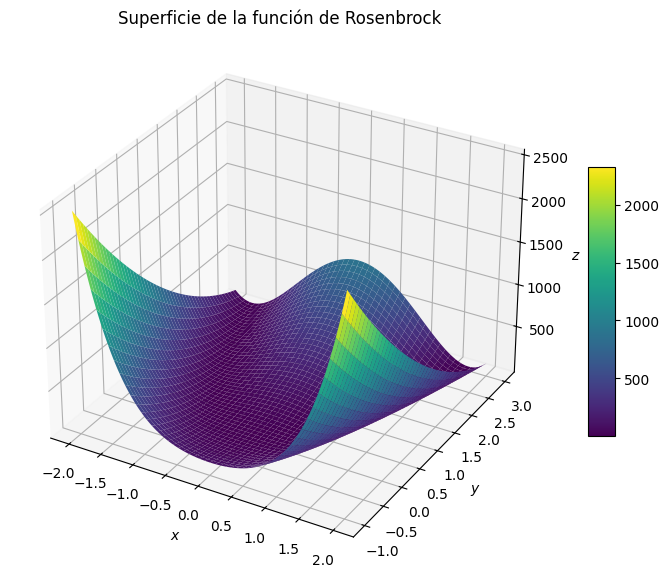

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definición de la función de Rosenbrock
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Crear los valores para x1 y x2
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)

# Calcular los valores de la función
Z = rosenbrock(X, Y)

# Representar la superficie de la función
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')
ax.set_title("Superficie de la función de Rosenbrock")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
fig.colorbar(surf, shrink=0.5, aspect=10)
plt.show()

Curvas de nivel en dos dimensiones

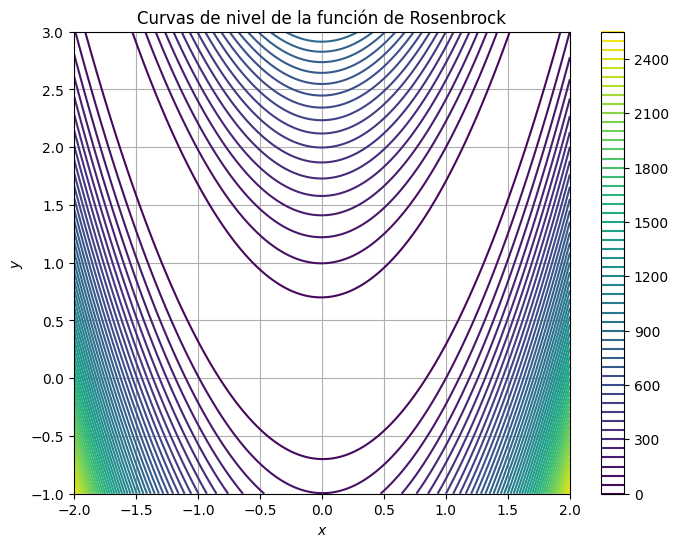

In [ ]:
# Representar las curvas de nivel de la función de Rosenbrock
plt.figure(figsize=(8, 6))
contour = plt.contour(X, Y, Z, levels=50, cmap='viridis')
plt.colorbar(contour)
plt.title("Curvas de nivel de la función de Rosenbrock")
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.grid(True)
plt.show()

### 2D

Resultado Rosenbrock:
Punto inicial: [-0.50183952  1.80285723]
Punto final: [0.14611719 0.01912182]
Valor final: 0.7296124437121165


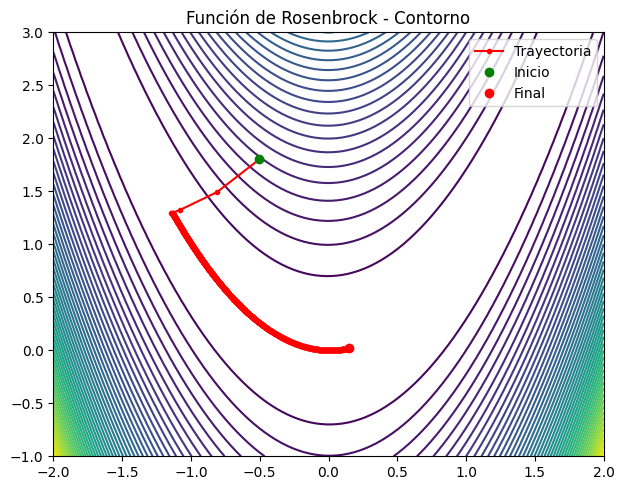

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock(x, y=None):
    """Función de Rosenbrock: f(x,y) = (1-x)^2 + 100(y-x^2)^2"""
    if y is None:
        return rosenbrock(x[0], x[1])
    return (1-x)**2 + 100*(y-x**2)**2

def gradient_rosenbrock(x, y):
    """Gradiente de la función de Rosenbrock"""
    dx = -2*(1-x) + 200*(y-x**2)*(-2*x)
    dy = 200*(y-x**2)
    return np.array([dx, dy])

def gradient_descent(f, gradient, x0, learning_rate=0.001, n_iterations=1000, tolerance=1e-6):
    """Implementación del descenso por gradiente"""
    path = [x0]
    x = x0

    for i in range(n_iterations):
        grad = gradient(x[0], x[1])
        if np.all(np.abs(grad) < tolerance):
            break

        x = x - learning_rate * grad
        path.append(x)

    return np.array(path)

# Punto inicial aleatorio
np.random.seed(42)
x0_rosenbrock = np.random.uniform(-2, 2, 2)

# Optimización
path_rosenbrock = gradient_descent(rosenbrock, gradient_rosenbrock, x0_rosenbrock)

# Visualización
def plot_optimization(f, path, x_range, y_range):
    x = np.linspace(x_range[0], x_range[1], 100)
    y = np.linspace(y_range[0], y_range[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[f(xi, yi) for xi in x] for yi in y])

    fig = plt.figure(figsize=(12, 5))

    # Contour plot
    ax1 = fig.add_subplot(121)
    ax1.contour(X, Y, Z, levels=50)
    ax1.plot(path[:, 0], path[:, 1], 'r.-', label='Trayectoria')
    ax1.plot(path[0, 0], path[0, 1], 'go', label='Inicio')
    ax1.plot(path[-1, 0], path[-1, 1], 'ro', label='Final')
    ax1.set_title('Función de Rosenbrock - Contorno')
    ax1.legend()



    plt.tight_layout()
    return fig

# Generar visualización
fig = plot_optimization(rosenbrock, path_rosenbrock, (-2, 2), (-1, 3))

print("Resultado Rosenbrock:")
print(f"Punto inicial: {x0_rosenbrock}")
print(f"Punto final: {path_rosenbrock[-1]}")
print(f"Valor final: {rosenbrock(path_rosenbrock[-1])}")

### Animación 2D

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_gradient_descent(f, gradient, x0, learning_rate=0.001, n_iterations=1000, tolerance=1e-6):
    """
    Genera una animación del proceso de descenso por gradiente para la función de Rosenbrock.

    Parámetros:
    - f: Función objetivo a minimizar
    - gradient: Función de gradiente de f
    - x0: Punto inicial
    - learning_rate: Tasa de aprendizaje
    - n_iterations: Número máximo de iteraciones
    - tolerance: Tolerancia para detener el descenso

    Retorna: Objeto de animación de matplotlib
    """
    # Configuración del dominio para contornos
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-1, 3, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[f(xi, yi) for xi in x] for yi in y])

    # Calculamos la trayectoria del descenso por gradiente
    path = [x0]
    x = x0

    for i in range(n_iterations):
        grad = gradient(x[0], x[1])
        if np.all(np.abs(grad) < tolerance):
            break

        x = x - learning_rate * grad
        path.append(x)

    path = np.array(path)

    # Configuración de la figura
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.contour(X, Y, Z, levels=50, cmap='viridis', alpha=0.6)

    # Línea de trayectoria
    line, = ax.plot([], [], 'r.-', label='Trayectoria')
    point, = ax.plot([], [], 'ro', label='Punto actual')

    # Punto de inicio
    ax.plot(path[0, 0], path[0, 1], 'go', label='Inicio')

    # Punto final
    ax.plot(path[-1, 0], path[-1, 1], 'ko', label='Final')

    ax.set_title('Descenso por Gradiente - Función de Rosenbrock')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.legend()

    # Límites de los ejes
    ax.set_xlim(-2, 2)
    ax.set_ylim(-1, 3)

    # Función de inicialización
    def init():
        line.set_data([], [])
        point.set_data([], [])
        return line, point

    # Función de animación
    def animate(i):
        line.set_data(path[:i, 0], path[:i, 1])
        point.set_data(path[i, 0], path[i, 1])
        return line, point

    # Crear animación
    anim = FuncAnimation(fig, animate, init_func=init,
                         frames=len(path), interval=50,
                         blit=True, repeat_delay=1000)

    # Guardar la animación (opcional)
    anim.save('rosenbrock_gradient_descent.gif', writer='pillow')

    plt.close(fig)  # Cerrar la figura para que no se muestre estáticamente

    return anim

# Crear animación
anim = animate_gradient_descent(rosenbrock, gradient_rosenbrock, x0_rosenbrock)


<ipython-input-3-546714cd1fc5>:71: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(path[i, 0], path[i, 1])


### 3D

<ipython-input-11-584da3095f00>:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


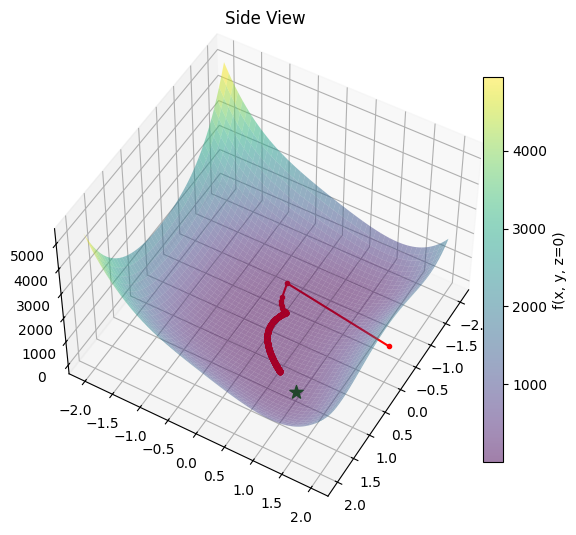

Starting point: (-0.5018, 1.8029, 0.9280)
Final point: (0.7722, 0.5956, 0.3524)
Minimum value: 0.216029


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock_3d(x, y, z):
    """3D Rosenbrock function"""
    return (1-x)**2 + 100*(y-x**2)**2 + (1-y)**2 + 100*(z-y**2)**2

def gradient_descent_3d(x0, y0, z0, learning_rate=0.001, epochs=1000):
    path = [(x0, y0, z0)]
    x, y, z = x0, y0, z0

    for _ in range(epochs):
        h = 1e-7
        dx = (rosenbrock_3d(x + h, y, z) - rosenbrock_3d(x - h, y, z)) / (2*h)
        dy = (rosenbrock_3d(x, y + h, z) - rosenbrock_3d(x, y - h, z)) / (2*h)
        dz = (rosenbrock_3d(x, y, z + h) - rosenbrock_3d(x, y, z - h)) / (2*h)

        x -= learning_rate * dx
        y -= learning_rate * dy
        z -= learning_rate * dz
        path.append((x, y, z))

        if abs(dx) < 1e-6 and abs(dy) < 1e-6 and abs(dz) < 1e-6:
            break

    return np.array(path), rosenbrock_3d(x, y, z)

# Generate surface points with finer resolution
x = np.linspace(-2, 2, 100)
y = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

# Calculate Z values for visualization (using z=0 plane)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rosenbrock_3d(X[i,j], Y[i,j], 0)

# Optimization
np.random.seed(42)
x0 = np.random.uniform(-2, 2)
y0 = np.random.uniform(-2, 2)
z0 = np.random.uniform(-2, 2)
path, minimum = gradient_descent_3d(x0, y0, z0)

# Create figure with multiple views
fig = plt.figure(figsize=(15, 5))

# View 1: Side view
ax1 = fig.add_subplot(131, projection='3d')
surf1 = ax1.plot_surface(X, Y, Z, alpha=0.5, cmap='viridis')
ax1.plot3D(path[:, 0], path[:, 1], path[:, 2], 'r.-', label='Path')
ax1.scatter(1, 1, 1, color='g', marker='*', s=100, label='Minimum')
ax1.view_init(elev=50, azim=30)
ax1.set_title('Side View')



# Add colorbar and adjust layout
plt.colorbar(surf1, ax=[ax1], label='f(x, y, z=0)')
plt.tight_layout()
plt.show()

print(f"Starting point: ({x0:.4f}, {y0:.4f}, {z0:.4f})")
print(f"Final point: ({path[-1,0]:.4f}, {path[-1,1]:.4f}, {path[-1,2]:.4f})")
print(f"Minimum value: {minimum:.6f}")

## Rastrigin

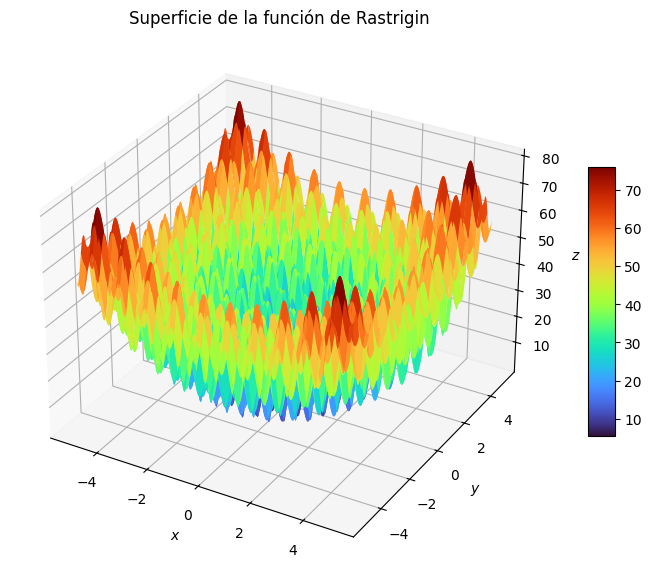

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definición de la función de Rastrigin
def rastrigin(x, y, A=10):
    return A * 2 + (x**2 - A * np.cos(2 * np.pi * x)) + (y**2 - A * np.cos(2 * np.pi * y))

# Crear los valores para x1 y x2
x = np.linspace(-5.12, 5.12, 400)
y = np.linspace(-5.12, 5.12, 400)
X, Y = np.meshgrid(x, y)

# Calcular los valores de la función
Z = rastrigin(X, Y)

# Representar la superficie de la función
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='turbo', edgecolor='none')
ax.set_title("Superficie de la función de Rastrigin")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
fig.colorbar(surf, shrink=0.5, aspect=10)
plt.show()

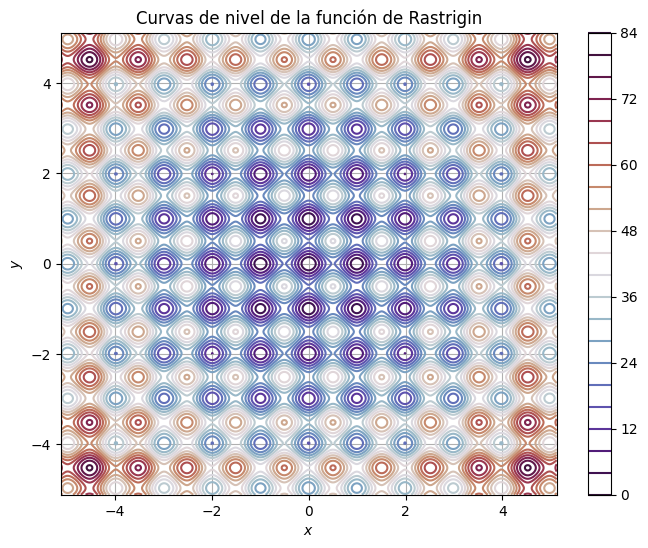

In [ ]:
# Representar las curvas de nivel de la función de Rastrigin
plt.figure(figsize=(8, 6))
contour = plt.contour(X, Y, Z, levels=25, cmap='twilight_shifted')
plt.colorbar(contour)
plt.title("Curvas de nivel de la función de Rastrigin")
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.grid(True)
plt.show()

### 2D

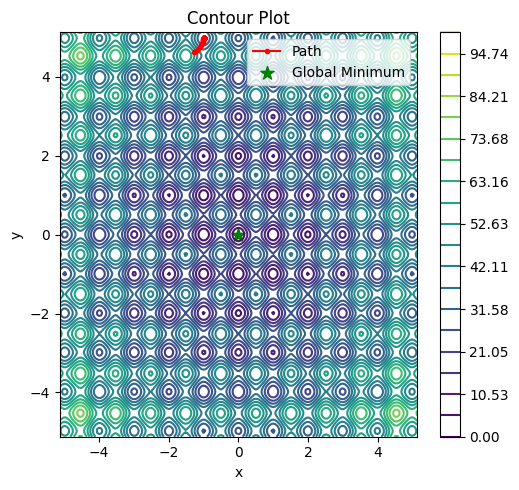


Rastrigin 2D Optimization Results:
Starting point: (-1.2847, 4.6153)
Final point: (-0.9950, 4.9747)
Minimum value found: 25.868682
Number of iterations: 44


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def rastrigin_2d(x, y):
    """2D Rastrigin function"""
    return 20 + (x**2 - 10*np.cos(2*np.pi*x)) + \
           (y**2 - 10*np.cos(2*np.pi*y))

def gradient_descent_2d(x0, y0, learning_rate=0.001, epochs=1000):
    path = [(x0, y0)]
    x, y = x0, y0

    for _ in range(epochs):
        # Numerical gradient computation
        h = 1e-7
        dx = (rastrigin_2d(x + h, y) - rastrigin_2d(x - h, y)) / (2*h)
        dy = (rastrigin_2d(x, y + h) - rastrigin_2d(x, y - h)) / (2*h)

        # Update position
        x -= learning_rate * dx
        y -= learning_rate * dy
        path.append((x, y))

        if abs(dx) < 1e-6 and abs(dy) < 1e-6:
            break

    return np.array(path), rastrigin_2d(x, y)

# Generate surface points
x = np.linspace(-5.12, 5.12, 200)
y = np.linspace(-5.12, 5.12, 200)
X, Y = np.meshgrid(x, y)
Z = rastrigin_2d(X, Y)

# Optimization with random initial point
np.random.seed(42)
x0 = np.random.uniform(-5.12, 5.12)
y0 = np.random.uniform(-5.12, 5.12)
path, minimum = gradient_descent_2d(x0, y0)

# Create figure with multiple views
fig = plt.figure(figsize=(15, 5))



# Contour plot with path
ax2 = fig.add_subplot(132)
contours = ax2.contour(X, Y, Z, levels=np.linspace(0, 100, 20))
ax2.plot(path[:, 0], path[:, 1], 'r.-', label='Path')
ax2.scatter(0, 0, color='g', marker='*', s=100, label='Global Minimum')
ax2.set_title('Contour Plot')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
plt.colorbar(contours, ax=ax2)
ax2.legend()



plt.tight_layout()
plt.show()

print("\nRastrigin 2D Optimization Results:")
print(f"Starting point: ({x0:.4f}, {y0:.4f})")
print(f"Final point: ({path[-1,0]:.4f}, {path[-1,1]:.4f})")
print(f"Minimum value found: {minimum:.6f}")
print(f"Number of iterations: {len(path)}")

### Animación 2D

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_gradient_descent_rastrigin(x0, y0, learning_rate=0.001, epochs=1000):
    """
    Generar una animación del descenso por gradiente para la función Rastrigin.

    Parámetros:
    - x0, y0: Coordenadas del punto inicial
    - tasa_de_aprendizaje: Tamaño del paso para el descenso por gradiente
    - epochs: Número máximo de iteraciones

    Retorna: Objeto de animación de Matplotlib
    """

    # Compute path
    path = [(x0, y0)]
    x, y = x0, y0

    for _ in range(epochs):
        # Numerical gradient computation
        h = 1e-7
        dx = (rastrigin_2d(x + h, y) - rastrigin_2d(x - h, y)) / (2*h)
        dy = (rastrigin_2d(x, y + h) - rastrigin_2d(x, y - h)) / (2*h)

        # Update position
        x -= learning_rate * dx
        y -= learning_rate * dy
        path.append((x, y))

        if abs(dx) < 1e-6 and abs(dy) < 1e-6:
            break

    path = np.array(path)

    # Prepare contour plot
    x = np.linspace(-5.12, 5.12, 200)
    y = np.linspace(-5.12, 5.12, 200)
    X, Y = np.meshgrid(x, y)
    Z = rastrigin_2d(X, Y)

    # Create figure and plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.contour(X, Y, Z, levels=np.linspace(0, 100, 20), cmap='viridis', alpha=0.6)

    # Plot elements
    line, = ax.plot([], [], 'r.-', label='Path')
    point, = ax.plot([], [], 'ro', label='Current Point')

    # Starting and global minimum points
    ax.plot(x0, y0, 'go', label='Start')
    ax.plot(0, 0, 'k*', markersize=10, label='Global Minimum')

    ax.set_title('Descenso por Gradiente - Función Rastrigin')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.legend()
    ax.set_xlim(-5.12, 5.12)
    ax.set_ylim(-5.12, 5.12)

    # Animation functions
    def init():
        line.set_data([], [])
        point.set_data([], [])
        return line, point

    def animate(i):
        line.set_data(path[:i, 0], path[:i, 1])
        point.set_data(path[i, 0], path[i, 1])
        return line, point

    # Create animation
    anim = FuncAnimation(fig, animate, init_func=init,
                         frames=len(path), interval=50,
                         blit=True, repeat_delay=1000)

    # Optional: Save animation
    anim.save('rastrigin_gradient_descent.gif', writer='pillow')

    plt.close(fig)  # Close the figure to prevent it from being displayed

    return anim

# Create animation
anim = animate_gradient_descent_rastrigin(x0, y0)



<ipython-input-2-255a3ed2939a>:70: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  point.set_data(path[i, 0], path[i, 1])


###3D

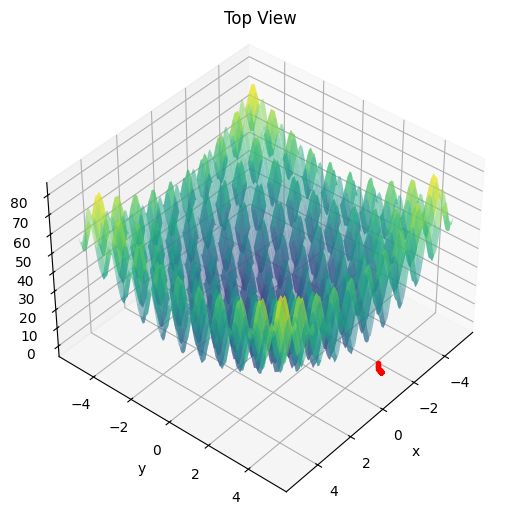


Rastrigin 3D Optimization Results:
Starting point: (-1.2847, 4.6153, 2.3756)
Final point: (-0.9950, 4.9747, 1.9899)
Minimum value: 29.848513
Number of iterations: 44


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rastrigin_3d(x, y, z):
    """3D Rastrigin function"""
    return 30 + (x**2 - 10*np.cos(2*np.pi*x)) + \
           (y**2 - 10*np.cos(2*np.pi*y)) + \
           (z**2 - 10*np.cos(2*np.pi*z))

def gradient_descent_3d(x0, y0, z0, learning_rate=0.001, epochs=1000):
    path = [(x0, y0, z0)]
    x, y, z = x0, y0, z0

    for _ in range(epochs):
        h = 1e-7
        dx = (rastrigin_3d(x + h, y, z) - rastrigin_3d(x - h, y, z)) / (2*h)
        dy = (rastrigin_3d(x, y + h, z) - rastrigin_3d(x, y - h, z)) / (2*h)
        dz = (rastrigin_3d(x, y, z + h) - rastrigin_3d(x, y, z - h)) / (2*h)

        x -= learning_rate * dx
        y -= learning_rate * dy
        z -= learning_rate * dz
        path.append((x, y, z))

        if abs(dx) < 1e-6 and abs(dy) < 1e-6 and abs(dz) < 1e-6:
            break

    return np.array(path), rastrigin_3d(x, y, z)

# Generate surface points with finer resolution
x = np.linspace(-5.12, 5.12, 100)
y = np.linspace(-5.12, 5.12, 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

# Calculate Z values for visualization (using z=0 plane)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rastrigin_3d(X[i,j], Y[i,j], 0)

# Optimization
np.random.seed(42)
x0 = np.random.uniform(-5.12, 5.12)
y0 = np.random.uniform(-5.12, 5.12)
z0 = np.random.uniform(-5.12, 5.12)
path, minimum = gradient_descent_3d(x0, y0, z0)

# Create figure with multiple views
fig = plt.figure(figsize=(15, 5))



# View 2: Top view
ax2 = fig.add_subplot(132, projection='3d')
surf2 = ax2.plot_surface(X, Y, Z, alpha=0.5, cmap='viridis')
ax2.plot3D(path[:, 0], path[:, 1], path[:, 2], 'r.-')
ax2.scatter(0, 0, 0, color='g', marker='*', s=100)
ax2.view_init(elev=40, azim=40)
ax2.set_title('Top View')
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')



# Add colorbar and adjust layout
plt.tight_layout()
plt.show()

print("\nRastrigin 3D Optimization Results:")
print(f"Starting point: ({x0:.4f}, {y0:.4f}, {z0:.4f})")
print(f"Final point: ({path[-1,0]:.4f}, {path[-1,1]:.4f}, {path[-1,2]:.4f})")
print(f"Minimum value: {minimum:.6f}")
print(f"Number of iterations: {len(path)}")

# Algoritmo evolutivo

## Rosenbrock

### 2D

Resultado de la optimización:
Mejor solución encontrada: [1.02017894 1.04046072]
Mejor valor de fitness: 0.00041645235151408774


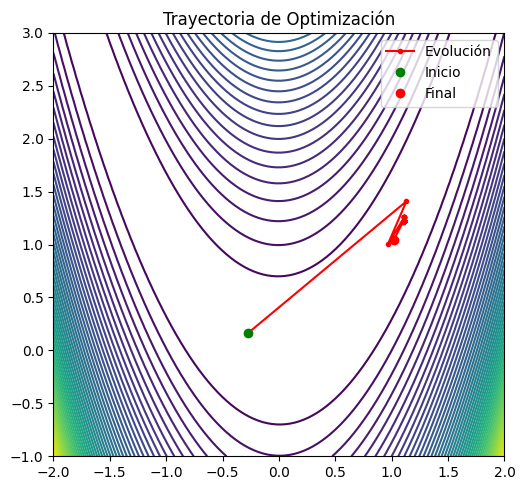

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

np.random.seed(42)

def rosenbrock(x):
    """Función de Rosenbrock en 2D"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2

class EvolutionaryOptimizer:
    def __init__(self, fitness_func, bounds, pop_size=50, mutation_rate=0.1):
        self.fitness_func = fitness_func
        self.bounds = bounds
        self.pop_size = pop_size
        self.mutation_rate = mutation_rate
        self.dimension = len(bounds)

    def initialize_population(self):
        """Inicializa la población aleatoriamente dentro de los límites"""
        population = []
        for _ in range(self.pop_size):
            individual = [np.random.uniform(self.bounds[d][0], self.bounds[d][1])
                        for d in range(self.dimension)]
            population.append(individual)
        return np.array(population)

    def mutate(self, individual):
        """Aplica mutación gaussiana"""
        mutation = np.random.normal(0, 0.1, self.dimension)
        mutated = individual + mutation
        # Asegura que los valores estén dentro de los límites
        for d in range(self.dimension):
            mutated[d] = np.clip(mutated[d], self.bounds[d][0], self.bounds[d][1])
        return mutated

    def crossover(self, parent1, parent2):
        """Realiza cruce aritmético"""
        alpha = np.random.random()
        child = alpha * parent1 + (1 - alpha) * parent2
        return child

    def select_parents(self, population, fitness_values):
        """Selección por torneo"""
        tournament_size = 3
        idx1 = np.random.randint(0, self.pop_size)
        for _ in range(tournament_size - 1):
            idx2 = np.random.randint(0, self.pop_size)
            if fitness_values[idx2] < fitness_values[idx1]:
                idx1 = idx2
        return population[idx1]

    def optimize(self, n_generations=100):
        """Ejecuta el algoritmo evolutivo"""
        population = self.initialize_population()
        best_solutions = []
        best_fitness_history = []

        for generation in range(n_generations):
            fitness_values = np.array([self.fitness_func(ind) for ind in population])
            best_idx = np.argmin(fitness_values)
            best_solutions.append(population[best_idx].copy())
            best_fitness_history.append(fitness_values[best_idx])

            new_population = []

            # Elitismo: mantener al mejor individuo
            new_population.append(population[best_idx].copy())

            # Generar nueva población
            while len(new_population) < self.pop_size:
                parent1 = self.select_parents(population, fitness_values)
                parent2 = self.select_parents(population, fitness_values)
                child = self.crossover(parent1, parent2)

                # Aplicar mutación con cierta probabilidad
                if np.random.random() < self.mutation_rate:
                    child = self.mutate(child)

                new_population.append(child)

            population = np.array(new_population)

        return np.array(best_solutions), np.array(best_fitness_history)

# Configuración y ejecución
bounds = [(-2, 2), (-1, 3)]  # Límites para x e y
optimizer = EvolutionaryOptimizer(rosenbrock, bounds)
best_solutions, best_fitness_history = optimizer.optimize(n_generations=100)

# Visualización
def plot_optimization_results(best_solutions, best_fitness_history):
    fig = plt.figure(figsize=(15, 5))


    # Visualización 2D del camino
    ax2 = fig.add_subplot(132)
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-1, 3, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

    ax2.contour(X, Y, Z, levels=50)
    ax2.plot(best_solutions[:, 0], best_solutions[:, 1], 'r.-', label='Evolución')
    ax2.plot(best_solutions[0, 0], best_solutions[0, 1], 'go', label='Inicio')
    ax2.plot(best_solutions[-1, 0], best_solutions[-1, 1], 'ro', label='Final')
    ax2.set_title('Trayectoria de Optimización')
    ax2.legend()



    plt.tight_layout()
    return fig

# Generar visualización
fig = plot_optimization_results(best_solutions, best_fitness_history)

print("Resultado de la optimización:")
print(f"Mejor solución encontrada: {best_solutions[-1]}")
print(f"Mejor valor de fitness: {best_fitness_history[-1]}")

### Animación 2D

<ipython-input-27-3e4fef73272d>:112: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  best_point.set_data(best_solution[0], best_solution[1])
<ipython-input-27-3e4fef73272d>:112: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  best_point.set_data(best_solution[0], best_solution[1])


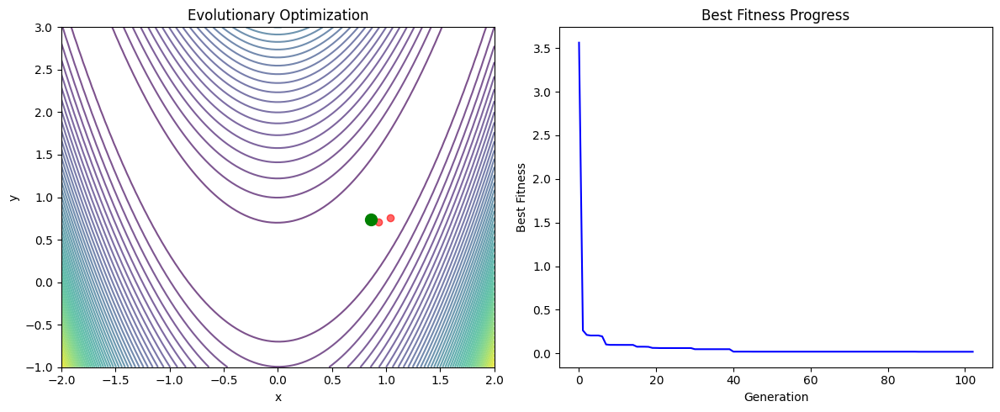

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def rosenbrock(x):
    """Rosenbrock function in 2D"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2

class EvolutionaryOptimizer:
    def __init__(self, fitness_func, bounds, pop_size=50, mutation_rate=0.1):
        self.fitness_func = fitness_func
        self.bounds = bounds
        self.pop_size = pop_size
        self.mutation_rate = mutation_rate
        self.dimension = len(bounds)

    def initialize_population(self):
        """Initialize population randomly within bounds"""
        population = []
        for _ in range(self.pop_size):
            individual = [np.random.uniform(self.bounds[d][0], self.bounds[d][1])
                        for d in range(self.dimension)]
            population.append(individual)
        return np.array(population)

    def mutate(self, individual):
        """Apply Gaussian mutation"""
        mutation = np.random.normal(0, 0.1, self.dimension)
        mutated = individual + mutation
        # Ensure values are within bounds
        for d in range(self.dimension):
            mutated[d] = np.clip(mutated[d], self.bounds[d][0], self.bounds[d][1])
        return mutated

    def crossover(self, parent1, parent2):
        """Perform arithmetic crossover"""
        alpha = np.random.random()
        child = alpha * parent1 + (1 - alpha) * parent2
        return child

    def select_parents(self, population, fitness_values):
        """Tournament selection"""
        tournament_size = 3
        idx1 = np.random.randint(0, self.pop_size)
        for _ in range(tournament_size - 1):
            idx2 = np.random.randint(0, self.pop_size)
            if fitness_values[idx2] < fitness_values[idx1]:
                idx1 = idx2
        return population[idx1]

    def optimize_step(self, population):
        """Perform one step of the evolutionary optimization"""
        fitness_values = np.array([self.fitness_func(ind) for ind in population])
        best_idx = np.argmin(fitness_values)

        new_population = [population[best_idx].copy()]  # Elitism

        while len(new_population) < self.pop_size:
            parent1 = self.select_parents(population, fitness_values)
            parent2 = self.select_parents(population, fitness_values)
            child = self.crossover(parent1, parent2)

            if np.random.random() < self.mutation_rate:
                child = self.mutate(child)

            new_population.append(child)

        return np.array(new_population), fitness_values[best_idx], population[best_idx]

def create_rosenbrock_animation():
    # Set up the optimization
    bounds = [(-2, 2), (-1, 3)]
    optimizer = EvolutionaryOptimizer(rosenbrock, bounds)
    population = optimizer.initialize_population()

    # Prepare the visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Contour plot setup
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-1, 3, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

    ax1.contour(X, Y, Z, levels=50, cmap='viridis', alpha=0.7)
    ax1.set_title('Evolutionary Optimization')
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')

    # Population scatter plot
    scatter = ax1.scatter(population[:, 0], population[:, 1], c='red', alpha=0.6)
    best_point, = ax1.plot([], [], 'go', markersize=10)

    # Fitness progress plot
    ax2.set_title('Best Fitness Progress')
    ax2.set_xlabel('Generation')
    ax2.set_ylabel('Best Fitness')
    line, = ax2.plot([], [], 'b-')

    fitness_history = []

    def update(frame):
        nonlocal population

        # Perform optimization step
        population, best_fitness, best_solution = optimizer.optimize_step(population)

        # Update population scatter
        scatter.set_offsets(population)

        # Update best point
        best_point.set_data(best_solution[0], best_solution[1])

        # Update fitness history
        fitness_history.append(best_fitness)
        line.set_data(range(len(fitness_history)), fitness_history)

        # Update axes limits for fitness plot
        ax2.relim()
        ax2.autoscale_view()

        return scatter, best_point, line

    # Create animation
    anim = FuncAnimation(fig, update, frames=100, interval=50, blit=True)

    plt.tight_layout()
    return anim

# Create and save the animation
anim = create_rosenbrock_animation()
anim.save('rosenbrock_evolution.gif', writer='pillow')

###3D

Punto final alcanzado: (0.5117, 0.2623)
Valor de la función en el punto final: 87.4993
Número de iteraciones: 5001


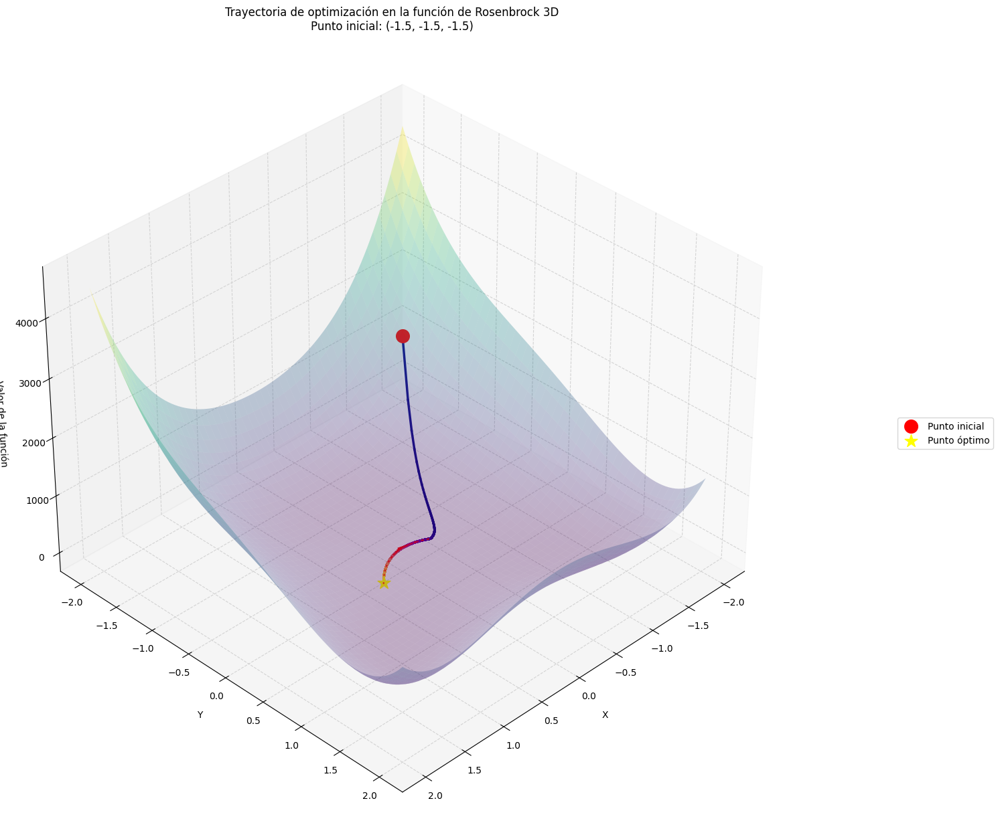

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock_3d(x, y, z):
    """
    3D Rosenbrock function
    f(x,y,z) = (1-x)^2 + 100(y-x^2)^2 + (1-y)^2 + 100(z-y**2)^2
    """
    return (1-x)**2 + 100*(y-x**2)**2 + (1-y)**2 + 100*(z-y**2)**2

def rosenbrock_gradient(x, y, z):
    """
    Gradiente de la función de Rosenbrock 3D
    """
    dx = -2*(1-x) - 400*x*(y-x**2)
    dy = 200*(y-x**2) - 2*(1-y) - 400*y*(z-y**2)
    dz = 200*(z-y**2)
    return np.array([dx, dy, dz])

def gradient_descent(start_point, learning_rate=0.0001, n_iterations=5000, tolerance=1e-6):
    """
    Implementa descenso de gradiente para la función de Rosenbrock 3D
    con criterio de convergencia
    """
    path = [start_point]
    point = np.array(start_point)

    for _ in range(n_iterations):
        gradient = rosenbrock_gradient(point[0], point[1], point[2])
        new_point = point - learning_rate * gradient

        # Criterio de convergencia
        if np.all(np.abs(new_point - point) < tolerance):
            path.append(new_point)
            break

        point = new_point
        path.append(point.copy())

    return np.array(path)

def plot_rosenbrock_single_trajectory():
    # Crear figura
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(111, projection='3d')

    # Definir rangos para la superficie
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-2, 2, 100)
    X, Y = np.meshgrid(x, y)
    Z = rosenbrock_3d(X, Y, 1)

    # Graficar la superficie con transparencia
    surf = ax.plot_surface(X, Y, Z, cmap='viridis',
                          alpha=0.3, linewidth=0, antialiased=True)

    # Calcular trayectoria desde un punto inicial
    start_point = [-1.5, -1.5, -1.5]
    trajectory = gradient_descent(start_point, learning_rate=0.0001, n_iterations=5000)

    # Calcular puntos para la trayectoria
    points = np.array([[x, y, rosenbrock_3d(x, y, 1)]
                      for x, y in zip(trajectory[:,0], trajectory[:,1])])

    # Crear gradiente de color para la trayectoria
    colors = plt.cm.plasma(np.linspace(0, 1, len(points)))

    # Graficar la línea de la trayectoria con gradiente de color
    for i in range(len(points)-1):
        ax.plot3D(points[i:i+2,0], points[i:i+2,1], points[i:i+2,2],
                 color=colors[i], linewidth=2.5)

    # Marcar punto inicial
    ax.scatter(start_point[0], start_point[1],
              rosenbrock_3d(start_point[0], start_point[1], 1),
              color='red', s=200, marker='o', label='Punto inicial')

    # Añadir flechas direccionales cada ciertos puntos
    n_arrows = 15
    arrow_indices = np.linspace(0, len(points)-2, n_arrows, dtype=int)
    for i in arrow_indices:
        direction = points[i+1] - points[i]
        ax.quiver(points[i,0], points[i,1], points[i,2],
                 direction[0], direction[1], direction[2],
                 color='red', length=0.2, normalize=True, alpha=0.7)

    # Marcar el punto óptimo (que debe coincidir con el punto final)
    final_point = points[-1]
    ax.scatter(final_point[0], final_point[1], final_point[2],
              color='yellow', s=200, marker='*', label='Punto óptimo')

    # Imprimir información sobre la convergencia
    print(f"Punto final alcanzado: ({final_point[0]:.4f}, {final_point[1]:.4f})")
    print(f"Valor de la función en el punto final: {rosenbrock_3d(final_point[0], final_point[1], 1):.4f}")
    print(f"Número de iteraciones: {len(trajectory)}")

    # Configurar la vista
    ax.view_init(elev=35, azim=45)
    ax.set_xlabel('X', labelpad=10)
    ax.set_ylabel('Y', labelpad=10)
    ax.set_zlabel('Valor de la función', labelpad=10)
    ax.set_title('Trayectoria de optimización en la función de Rosenbrock 3D\n'
                'Punto inicial: (-1.5, -1.5, -1.5)', pad=20)

    # Ajustar la leyenda
    ax.legend(bbox_to_anchor=(1.15, 0.5), loc='center left')



    plt.tight_layout()
    return fig

# Generar y mostrar la visualización
fig = plot_rosenbrock_single_trajectory()
plt.show()

## Rastrigin

### 2D

Generación 0:
  Mejor fitness: 25.275257
  Fitness promedio: 45.007182
  Diversidad: 3.258549
Generación 10:
  Mejor fitness: 0.018125
  Fitness promedio: 18.855041
  Diversidad: 1.062199
Generación 20:
  Mejor fitness: 0.000399
  Fitness promedio: 11.118183
  Diversidad: 0.244476
Generación 30:
  Mejor fitness: 0.000399
  Fitness promedio: 11.052892
  Diversidad: 0.183913
Generación 40:
  Mejor fitness: 0.000399
  Fitness promedio: 8.302492
  Diversidad: 0.192949
Estancamiento detectado en generación 44
Generación 50:
  Mejor fitness: 0.000399
  Fitness promedio: 18.214185
  Diversidad: 0.964977
Generación 60:
  Mejor fitness: 0.000399
  Fitness promedio: 12.729492
  Diversidad: 0.336803
Generación 70:
  Mejor fitness: 0.000399
  Fitness promedio: 11.156822
  Diversidad: 0.215816
Estancamiento detectado en generación 75
Generación 80:
  Mejor fitness: 0.000399
  Fitness promedio: 20.172106
  Diversidad: 1.217439
Generación 90:
  Mejor fitness: 0.000399
  Fitness promedio: 12.852691
  

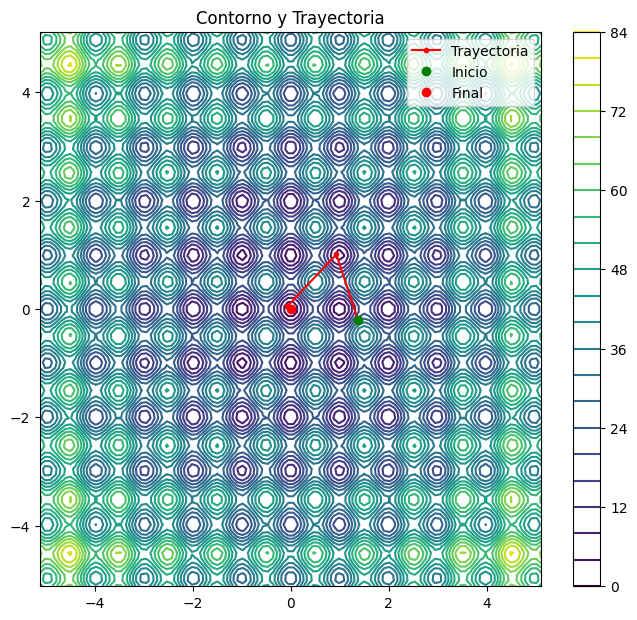

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from time import time

np.random.seed(42)

def rastrigin_2d(x):
    """
    2D Rastrigin function
    f(x,y) = 20 + x²-10cos(2πx) + y²-10cos(2πy)
    Global minimum at (0,0) = 0
    """
    A = 10
    return 2*A + sum(x[i]**2 - A * np.cos(2 * np.pi * x[i]) for i in range(2))

class OptimizedRastriginSolver:
    def __init__(self, fitness_func, bounds,
                 pop_size=150,        # Aumentado para mejor exploración
                 mutation_rate=0.4,    # Aumentado para escapar mínimos locales
                 crossover_rate=0.9,   # Alta tasa de cruce
                 elite_size=3):        # Mantenemos más soluciones élite

        self.fitness_func = fitness_func
        self.bounds = np.array(bounds)
        self.pop_size = pop_size
        self.mutation_rate = mutation_rate
        self.crossover_rate = crossover_rate
        self.elite_size = elite_size
        self.dimension = len(bounds)

        # Variables de seguimiento
        self.best_solution = None
        self.best_fitness = float('inf')
        self.generations_without_improvement = 0
        self.convergence_threshold = 1e-6

        # Parámetros adaptativos
        self.adaptive_mutation_strength = 0.1
        self.local_search_radius = 0.1

    def initialize_population(self):
        """Inicialización mejorada usando cuadrículas y perturbaciones"""
        population = []

        # Inicialización en cuadrícula
        grid_points = int(np.sqrt(self.pop_size))
        for i in range(grid_points):
            for j in range(grid_points):
                x = self.bounds[0][0] + (self.bounds[0][1] - self.bounds[0][0]) * i / (grid_points - 1)
                y = self.bounds[1][0] + (self.bounds[1][1] - self.bounds[1][0]) * j / (grid_points - 1)
                population.append([x + np.random.normal(0, 0.1), y + np.random.normal(0, 0.1)])

        # Completar con puntos aleatorios
        while len(population) < self.pop_size:
            individual = [np.random.uniform(self.bounds[i][0], self.bounds[i][1])
                        for i in range(self.dimension)]
            population.append(individual)

        return np.array(population)

    def adaptive_mutation(self, individual, fitness):
        """Mutación adaptativa basada en la distancia al mejor"""
        if self.best_solution is not None:
            distance = np.linalg.norm(individual - self.best_solution)
            strength = self.adaptive_mutation_strength * (1 + distance)

            # Mutación diferencial para cada dimensión
            mutation = np.random.normal(0, strength, self.dimension)
            mutation *= np.exp(-fitness / self.best_fitness)  # Reduce mutación para buenos individuos

            mutated = individual + mutation

            # Asegurar límites
            for d in range(self.dimension):
                mutated[d] = np.clip(mutated[d], self.bounds[d][0], self.bounds[d][1])

            return mutated
        return individual

    def improved_crossover(self, parent1, parent2):
        """Crossover mejorado con blend-alpha y arithmetic"""
        if np.random.random() < self.crossover_rate:
            alpha = 0.3
            beta = np.random.random()

            # Blend-alpha crossover
            gamma = np.random.uniform(-alpha, 1+alpha, self.dimension)
            child1 = parent1 + gamma * (parent2 - parent1)

            # Arithmetic crossover
            child2 = beta * parent1 + (1-beta) * parent2

            # Asegurar límites
            for child in [child1, child2]:
                for d in range(self.dimension):
                    child[d] = np.clip(child[d], self.bounds[d][0], self.bounds[d][1])

            return child1, child2
        return parent1.copy(), parent2.copy()

    def local_search(self, individual):
        """Búsqueda local para refinar soluciones prometedoras"""
        current_fitness = self.fitness_func(individual)
        improved = False

        for _ in range(5):  # Intentos de mejora local
            delta = np.random.uniform(-self.local_search_radius, self.local_search_radius, self.dimension)
            new_position = individual + delta

            # Asegurar límites
            for d in range(self.dimension):
                new_position[d] = np.clip(new_position[d], self.bounds[d][0], self.bounds[d][1])

            new_fitness = self.fitness_func(new_position)

            if new_fitness < current_fitness:
                individual = new_position
                current_fitness = new_fitness
                improved = True

        return individual if improved else individual

    def optimize(self, max_generations=200, tolerance=1e-6):
        """Proceso de optimización mejorado con criterios de parada adaptativos"""
        start_time = time()
        population = self.initialize_population()

        history = {
            'best_fitness': [],
            'avg_fitness': [],
            'diversity': [],
            'best_solutions': []
        }

        generation = 0
        generations_without_improvement = 0
        previous_best = float('inf')

        while generation < max_generations:
            # Evaluar población
            fitness_values = np.array([self.fitness_func(ind) for ind in population])

            # Actualizar mejor solución
            gen_best_idx = np.argmin(fitness_values)
            current_best = fitness_values[gen_best_idx]

            if current_best < self.best_fitness:
                self.best_fitness = current_best
                self.best_solution = population[gen_best_idx].copy()
                generations_without_improvement = 0
            else:
                generations_without_improvement += 1

            # Guardar estadísticas
            history['best_fitness'].append(self.best_fitness)
            history['avg_fitness'].append(np.mean(fitness_values))
            history['diversity'].append(np.std(population, axis=0).mean())
            history['best_solutions'].append(self.best_solution.copy())

            # Criterios de parada
            if self.best_fitness < tolerance:
                print(f"¡Convergencia alcanzada en generación {generation}!")
                break

            if generations_without_improvement > 30:
                print(f"Estancamiento detectado en generación {generation}")
                # Reiniciar parte de la población
                n_reinit = self.pop_size // 2
                population[-n_reinit:] = self.initialize_population()[:n_reinit]
                generations_without_improvement = 0

            # Crear nueva población
            new_population = []

            # Elitismo
            elite_indices = np.argsort(fitness_values)[:self.elite_size]
            for idx in elite_indices:
                new_population.append(population[idx].copy())

            # Generar nueva población
            while len(new_population) < self.pop_size:
                # Selección por torneo
                parent_indices = np.random.choice(len(population), size=2, replace=False)
                parent1, parent2 = population[parent_indices]

                # Crossover
                child1, child2 = self.improved_crossover(parent1, parent2)

                # Mutación y búsqueda local
                for child in [child1, child2]:
                    if len(new_population) < self.pop_size:
                        if np.random.random() < self.mutation_rate:
                            child = self.adaptive_mutation(child,
                                self.fitness_func(child))

                        # Aplicar búsqueda local a individuos prometedores
                        if self.fitness_func(child) < np.mean(fitness_values):
                            child = self.local_search(child)

                        new_population.append(child)

            population = np.array(new_population)

            # Reportar progreso
            if generation % 10 == 0:
                print(f"Generación {generation}:")
                print(f"  Mejor fitness: {self.best_fitness:.6f}")
                print(f"  Fitness promedio: {np.mean(fitness_values):.6f}")
                print(f"  Diversidad: {history['diversity'][-1]:.6f}")

            generation += 1

        end_time = time()
        print(f"\nOptimización completada en {end_time - start_time:.2f} segundos")
        print(f"Generaciones totales: {generation}")
        print(f"Mejor solución encontrada: {self.best_solution}")
        print(f"Mejor fitness: {self.best_fitness}")

        return history

    def plot_results(self, history):
        """Visualización mejorada de resultados"""
        fig = plt.figure(figsize=(20, 12))

        # Superficie 3D y trayectoria
        x = np.linspace(self.bounds[0][0], self.bounds[0][1], 100)
        y = np.linspace(self.bounds[1][0], self.bounds[1][1], 100)
        X, Y = np.meshgrid(x, y)
        Z = np.array([[self.fitness_func([xi, yi]) for xi in x] for yi in y])


        best_solutions = np.array(history['best_solutions'])


        # Contorno y trayectoria
        ax2 = fig.add_subplot(232)
        contour = ax2.contour(X, Y, Z, levels=20)
        ax2.plot(best_solutions[:, 0], best_solutions[:, 1], 'r.-', label='Trayectoria')
        ax2.plot(best_solutions[0, 0], best_solutions[0, 1], 'go', label='Inicio')
        ax2.plot(best_solutions[-1, 0], best_solutions[-1, 1], 'ro', label='Final')
        ax2.set_title('Contorno y Trayectoria')
        ax2.legend()
        fig.colorbar(contour, ax=ax2)





        plt.tight_layout()
        return fig

# Ejemplo de uso
if __name__ == "__main__":
    # Definir límites
    bounds = [(-5.12, 5.12), (-5.12, 5.12)]

    # Crear optimizador
    optimizer = OptimizedRastriginSolver(
        rastrigin_2d,
        bounds,
        pop_size=150,
        mutation_rate=0.4,
        crossover_rate=0.9,
        elite_size=3
    )

    # Ejecutar optimización
    history = optimizer.optimize(max_generations=200, tolerance=1e-6)

    # Visualizar resultados
    fig = optimizer.plot_results(history)
    plt.show()

### Animación 2D

<ipython-input-43-bf382c9e54c4>:84: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  best_point.set_data(best_solution[0], best_solution[1])


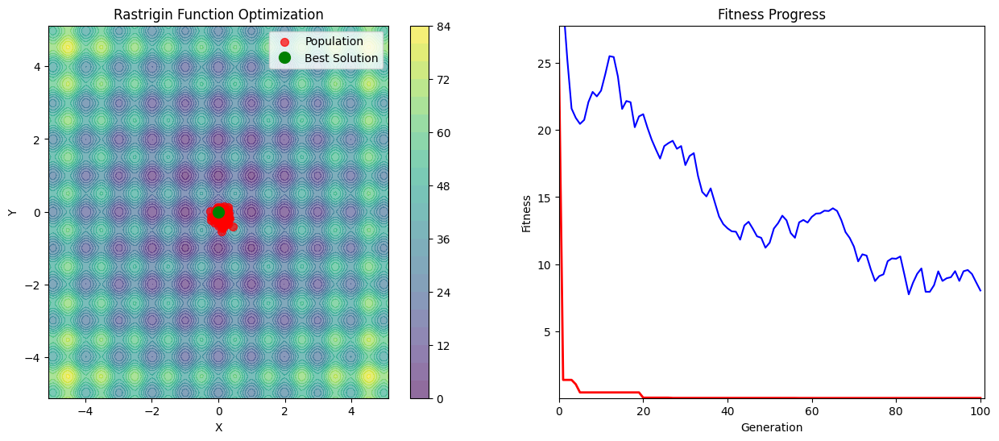

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D

class RastriginAnimatedOptimizer:
    def __init__(self, fitness_func, bounds, pop_size=150):
        self.fitness_func = fitness_func
        self.bounds = np.array(bounds)
        self.pop_size = pop_size
        self.dimension = len(bounds)
        np.random.seed(42)

    def initialize_population(self):
        population = []
        grid_points = int(np.sqrt(self.pop_size))
        for i in range(grid_points):
            for j in range(grid_points):
                x = self.bounds[0][0] + (self.bounds[0][1] - self.bounds[0][0]) * i / (grid_points - 1)
                y = self.bounds[1][0] + (self.bounds[1][1] - self.bounds[1][0]) * j / (grid_points - 1)
                population.append([x + np.random.normal(0, 0.1), y + np.random.normal(0, 0.1)])

        while len(population) < self.pop_size:
            individual = [np.random.uniform(self.bounds[i][0], self.bounds[i][1])
                        for i in range(self.dimension)]
            population.append(individual)

        return np.array(population)

    def create_optimization_animation(self, max_generations=100):
        # Prepare figure and axis
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        # Prepare Rastrigin function contour
        x = np.linspace(self.bounds[0][0], self.bounds[0][1], 200)
        y = np.linspace(self.bounds[1][0], self.bounds[1][1], 200)
        X, Y = np.meshgrid(x, y)
        Z = np.array([[self.fitness_func([xi, yi]) for xi in x] for yi in y])

        # Contour plot
        contour = ax1.contourf(X, Y, Z, levels=20, cmap=cm.viridis, alpha=0.6)
        fig.colorbar(contour, ax=ax1)
        ax1.set_title('Rastrigin Function Optimization')
        ax1.set_xlabel('X')
        ax1.set_ylabel('Y')

        # Population scatter plot
        scatter = ax1.scatter([], [], c='red', s=50, alpha=0.7, label='Population')
        best_point, = ax1.plot([], [], 'go', markersize=10, label='Best Solution')
        ax1.legend()

        # Fitness progress plot
        ax2.set_title('Fitness Progress')
        ax2.set_xlabel('Generation')
        ax2.set_ylabel('Fitness')
        fitness_line, = ax2.plot([], [], 'b-')
        best_fitness_line, = ax2.plot([], [], 'r-', linewidth=2)

        # Tracking lists
        best_fitness_history = []
        avg_fitness_history = []

        # Initialization
        population = self.initialize_population()

        def update(frame):
            nonlocal population

            # Evaluate population
            fitness_values = np.array([self.fitness_func(ind) for ind in population])

            # Track fitness
            best_fitness = np.min(fitness_values)
            avg_fitness = np.mean(fitness_values)
            best_fitness_history.append(best_fitness)
            avg_fitness_history.append(avg_fitness)

            # Update contour plot
            best_idx = np.argmin(fitness_values)
            best_solution = population[best_idx]

            scatter.set_offsets(population)
            best_point.set_data(best_solution[0], best_solution[1])

            # Update fitness plots
            fitness_line.set_data(range(len(avg_fitness_history)), avg_fitness_history)
            best_fitness_line.set_data(range(len(best_fitness_history)), best_fitness_history)

            # Simple evolutionary operators
            new_population = []

            # Elitism
            elite_indices = np.argsort(fitness_values)[:3]
            for idx in elite_indices:
                new_population.append(population[idx].copy())

            # Crossover and mutation
            while len(new_population) < self.pop_size:
                # Tournament selection
                parent_indices = np.random.choice(len(population), size=2, replace=False)
                parent1, parent2 = population[parent_indices]

                # Simple crossover
                child = 0.5 * (parent1 + parent2)

                # Mutation
                child += np.random.normal(0, 0.1, self.dimension)

                # Boundary check
                for d in range(self.dimension):
                    child[d] = np.clip(child[d], self.bounds[d][0], self.bounds[d][1])

                new_population.append(child)

            population = np.array(new_population)

            # Adjust plot ranges
            ax2.set_xlim(0, len(best_fitness_history))
            ax2.set_ylim(min(best_fitness_history)*0.9, max(best_fitness_history)*1.1)

            return scatter, best_point, fitness_line, best_fitness_line

        # Create animation
        anim = FuncAnimation(fig, update, frames=max_generations,
                             interval=100, blit=False, repeat=False)

        return anim

if __name__ == "__main__":
    bounds = [(-5.12, 5.12), (-5.12, 5.12)]
    optimizer = RastriginAnimatedOptimizer(rastrigin_2d, bounds)

    anim = optimizer.create_optimization_animation()
    anim.save('rastrigin_optimization.gif', writer='pillow')

    # To show the animation
    plt.show()

###3D

Generando visualización de la función Rastrigin 3D con trayectoria...


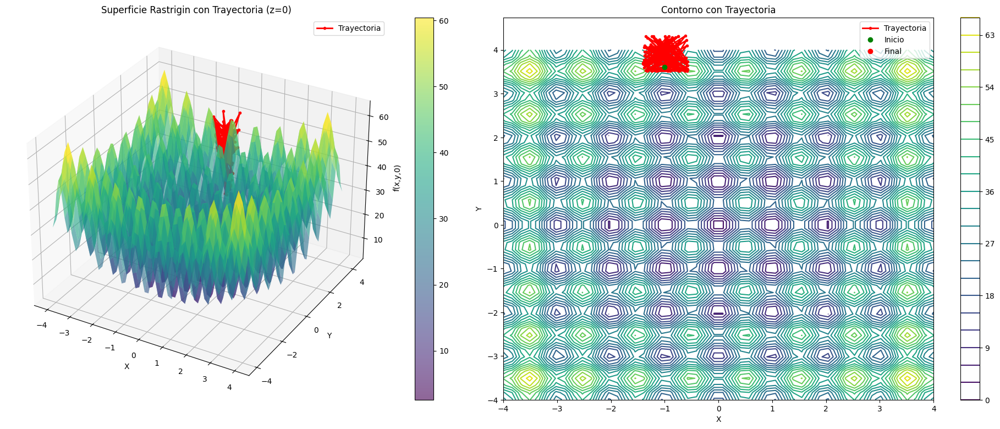


Resultados de la optimización:
Punto inicial: (0.789, -2.752, -2.752)
Valor inicial: 43.082
Punto final: (0.729, -2.834, -2.671)
Valor final: 46.733
Distancia al óptimo global: 3.962


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from matplotlib import cm

np.random.seed(42)

def rastrigin_3d(x, y, z):
    """
    Verdadera función Rastrigin 3D
    f(x,y,z) = 30 + (x²-10cos(2πx)) + (y²-10cos(2πy)) + (z²-10cos(2πz))
    Mínimo global en (0,0,0) = 0
    """
    A = 10
    return (3 * A +
            (x**2 - A * np.cos(2 * np.pi * x)) +
            (y**2 - A * np.cos(2 * np.pi * y)) +
            (z**2 - A * np.cos(2 * np.pi * z)))

def optimize_rastrigin():
    """
    Optimización simple para generar una trayectoria
    """
    # Parámetros de optimización
    n_iterations = 100
    learning_rate = 0.01

    # Punto inicial aleatorio
    current_point = np.random.uniform(-4, 4, 3)
    trajectory = [current_point.copy()]

    # Optimización por descenso de gradiente
    for _ in range(n_iterations):
        # Calcular gradiente numérico
        h = 1e-7
        gradient = np.zeros(3)

        for i in range(3):
            point_plus = current_point.copy()
            point_minus = current_point.copy()
            point_plus[i] += h
            point_minus[i] -= h

            gradient[i] = (rastrigin_3d(*point_plus) - rastrigin_3d(*point_minus)) / (2*h)

        # Actualizar posición
        current_point = current_point - learning_rate * gradient
        trajectory.append(current_point.copy())

    return np.array(trajectory)

def visualize_with_trajectory():
    """
    Crear visualización de la función Rastrigin en 3D con trayectoria
    """
    fig = plt.figure(figsize=(20, 15))
    gs = gridspec.GridSpec(2, 2, figure=fig)

    # Generar datos para visualización 3D
    points = 50
    x = np.linspace(-4, 4, points)
    y = np.linspace(-4, 4, points)
    X, Y = np.meshgrid(x, y)

    # Generar trayectoria
    trajectory = optimize_rastrigin()

    # 1. Vista principal: Superficie en z=0 con proyección de trayectoria
    ax1 = fig.add_subplot(gs[0, 0], projection='3d')
    Z_xy = rastrigin_3d(X, Y, np.zeros_like(X))
    surf1 = ax1.plot_surface(X, Y, Z_xy, cmap='viridis', alpha=0.6)

    # Plotear trayectoria
    traj_x = trajectory[:, 0]
    traj_y = trajectory[:, 1]
    traj_z = [rastrigin_3d(x, y, 0) for x, y in zip(traj_x, traj_y)]
    ax1.plot(traj_x, traj_y, traj_z, 'r.-', linewidth=2, label='Trayectoria')

    ax1.set_title('Superficie Rastrigin con Trayectoria (z=0)')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('f(x,y,0)')
    ax1.legend()
    fig.colorbar(surf1, ax=ax1)

    # 2. Vista de contorno con trayectoria
    ax2 = fig.add_subplot(gs[0, 1])
    contour = ax2.contour(X, Y, Z_xy, levels=20, cmap='viridis')
    ax2.plot(traj_x, traj_y, 'r.-', linewidth=2, label='Trayectoria')
    ax2.plot(traj_x[0], traj_y[0], 'go', label='Inicio')
    ax2.plot(traj_x[-1], traj_y[-1], 'ro', label='Final')
    ax2.set_title('Contorno con Trayectoria')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.legend()
    fig.colorbar(contour, ax=ax2)



    plt.tight_layout()
    return fig

# Ejecutar visualización
if __name__ == "__main__":
    print("Generando visualización de la función Rastrigin 3D con trayectoria...")
    fig = visualize_with_trajectory()
    plt.show()

    # Análisis de la optimización
    trajectory = optimize_rastrigin()
    final_point = trajectory[-1]
    final_value = rastrigin_3d(*final_point)

    print("\nResultados de la optimización:")
    print(f"Punto inicial: ({trajectory[0][0]:.3f}, {trajectory[0][1]:.3f}, {trajectory[0][2]:.3f})")
    print(f"Valor inicial: {rastrigin_3d(*trajectory[0]):.3f}")
    print(f"Punto final: ({final_point[0]:.3f}, {final_point[1]:.3f}, {final_point[2]:.3f})")
    print(f"Valor final: {final_value:.3f}")
    print(f"Distancia al óptimo global: {np.linalg.norm(final_point):.3f}")

#PSO

## Rosenbrock

### 2D

Resultados para Rosenbrock:
Mejor solución: [1.00184369 1.00370466]
Mejor valor: 3.4184593412694786e-06


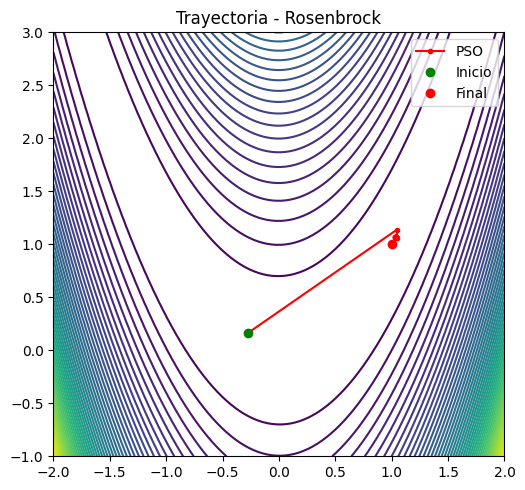

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock(x):
    """Función de Rosenbrock"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2

class PSO:
    def __init__(self, objective_func, bounds, n_particles=50, w=0.7, c1=2.0, c2=2.0):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_particles = n_particles
        self.w = w  # Inercia
        self.c1 = c1  # Coeficiente cognitivo
        self.c2 = c2  # Coeficiente social
        self.dim = len(bounds)
        np.random.seed(42)  # Establecer una semilla para reproducibilidad

        # Inicializar partículas y velocidades
        self.positions = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_particles, self.dim)
        )

        self.velocities = np.random.uniform(
            low=[-0.1*(b[1]-b[0]) for b in bounds],
            high=[0.1*(b[1]-b[0]) for b in bounds],
            size=(n_particles, self.dim)
        )

        # Mejor posición personal y global
        self.p_best_positions = self.positions.copy()
        self.p_best_scores = np.array([self.objective_func(p) for p in self.positions])
        self.g_best_position = self.p_best_positions[np.argmin(self.p_best_scores)]
        self.g_best_score = np.min(self.p_best_scores)

        # Historial para visualización
        self.history = [self.g_best_position.copy()]
        self.score_history = [self.g_best_score]

    def optimize(self, n_iterations=100):
        for _ in range(n_iterations):
            # Actualizar velocidades
            r1, r2 = np.random.rand(2)
            self.velocities = (self.w * self.velocities +
                             self.c1 * r1 * (self.p_best_positions - self.positions) +
                             self.c2 * r2 * (self.g_best_position - self.positions))

            # Actualizar posiciones
            self.positions += self.velocities

            # Mantener partículas dentro de los límites
            for i in range(self.dim):
                self.positions[:, i] = np.clip(
                    self.positions[:, i],
                    self.bounds[i][0],
                    self.bounds[i][1]
                )

            # Evaluar nuevas posiciones
            scores = np.array([self.objective_func(p) for p in self.positions])

            # Actualizar mejores posiciones personales
            improved = scores < self.p_best_scores
            self.p_best_scores[improved] = scores[improved]
            self.p_best_positions[improved] = self.positions[improved]

            # Actualizar mejor posición global
            min_score_idx = np.argmin(scores)
            if scores[min_score_idx] < self.g_best_score:
                self.g_best_score = scores[min_score_idx]
                self.g_best_position = self.positions[min_score_idx].copy()

            self.history.append(self.g_best_position.copy())
            self.score_history.append(self.g_best_score)

        return np.array(self.history), np.array(self.score_history)

    def optimize_step(self):
        """Realiza un paso (una iteración) del algoritmo PSO"""
        # Actualizar velocidades
        r1, r2 = np.random.rand(2)
        cognitive_component = self.c1 * r1 * (self.p_best_positions - self.positions)
        social_component = self.c2 * r2 * (self.g_best_position - self.positions)
        self.velocities = self.w * self.velocities + cognitive_component + social_component

        # Actualizar posiciones
        self.positions += self.velocities

        # Mantener partículas dentro de los límites
        for i in range(self.dim):
            self.positions[:, i] = np.clip(
                self.positions[:, i],
                self.bounds[i][0],
                self.bounds[i][1]
            )

        # Evaluar nuevas posiciones
        scores = np.array([self.objective_func(p) for p in self.positions])

        # Actualizar mejores posiciones personales
        improved = scores < self.p_best_scores
        self.p_best_scores[improved] = scores[improved]
        self.p_best_positions[improved] = self.positions[improved]

        # Actualizar mejor posición global
        min_score_idx = np.argmin(scores)
        if scores[min_score_idx] < self.g_best_score:
            self.g_best_score = scores[min_score_idx]
            self.g_best_position = self.positions[min_score_idx].copy()

        # Actualizar historial
        self.history.append(self.g_best_position.copy())
        self.score_history.append(self.g_best_score)

        return self.positions.copy(), self.g_best_position.copy(), self.g_best_score

# Configuración y ejecución
bounds = [(-2, 2), (-1, 3)]  # Límites para Rosenbrock
pso = PSO(rosenbrock, bounds)
history, score_history = pso.optimize(n_iterations=100)

# Visualización
fig = plt.figure(figsize=(15, 5))



# Visualización 2D
ax2 = fig.add_subplot(132)
x = np.linspace(bounds[0][0], bounds[0][1], 100)
y = np.linspace(bounds[1][0], bounds[1][1], 100)
X, Y = np.meshgrid(x, y)
Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

ax2.contour(X, Y, Z, levels=50)
ax2.plot(history[:, 0], history[:, 1], 'r.-', label='PSO')
ax2.plot(history[0, 0], history[0, 1], 'go', label='Inicio')
ax2.plot(history[-1, 0], history[-1, 1], 'ro', label='Final')
ax2.set_title('Trayectoria - Rosenbrock')
ax2.legend()



plt.tight_layout()

print("Resultados para Rosenbrock:")
print(f"Mejor solución: {history[-1]}")
print(f"Mejor valor: {score_history[-1]}")

### Animación 2d

In [ ]:
# Función para crear y guardar la animación
def create_rosenbrock_pso_animation(bounds, n_particles=50, n_iterations=100, filename='rosenbrock_pso_evolution.gif'):
    # Establecer una semilla para reproducibilidad (opcional)
    np.random.seed(42)  # Puedes cambiar este valor para diferentes resultados

    # Inicializar el optimizador PSO
    pso = PSO(rosenbrock, bounds, n_particles=n_particles)

    # Configurar la figura y los ejes
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Configuración del gráfico de contorno
    x = np.linspace(bounds[0][0], bounds[0][1], 400)
    y = np.linspace(bounds[1][0], bounds[1][1], 400)
    X, Y = np.meshgrid(x, y)
    Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

    contour = ax1.contourf(X, Y, Z, levels=50, cmap='viridis', alpha=0.75)
    fig.colorbar(contour, ax=ax1, label='Fitness')
    ax1.set_title('Particle Swarm Optimization - Rosenbrock Function')
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')

    # Inicializar el gráfico de dispersión de partículas
    scatter = ax1.scatter(pso.positions[:, 0], pso.positions[:, 1],
                          c='white', edgecolors='black', s=50, label='Partículas')

    # Inicializar el punto de la mejor posición global
    g_best_point, = ax1.plot([], [], 'r*', markersize=15, label='Mejor Global')

    ax1.legend(loc='upper right')

    # Configuración del gráfico de progreso de fitness
    ax2.set_title('Progreso del Mejor Fitness')
    ax2.set_xlabel('Iteración')
    ax2.set_ylabel('Mejor Fitness')
    line, = ax2.plot([], [], 'b-', label='Mejor Fitness')
    ax2.set_xlim(0, n_iterations)
    ax2.set_ylim(0, max(pso.score_history)*1.1)
    ax2.legend()
    ax2.grid(True)

    # Historial de fitness para la gráfica de progreso
    fitness_history = [pso.g_best_score]

    def init():
        """Inicialización de la animación"""
        scatter.set_offsets(pso.positions)
        g_best_point.set_data([], [])
        line.set_data([], [])
        return scatter, g_best_point, line

    def update(frame):
        """Actualización de cada cuadro de la animación"""
        positions, g_best_pos, g_best_score = pso.optimize_step()

        # Actualizar posiciones de las partículas
        scatter.set_offsets(positions)

        # Actualizar la mejor posición global
        g_best_point.set_data(g_best_pos[0], g_best_pos[1])

        # Actualizar historial de fitness
        fitness_history.append(g_best_score)
        line.set_data(range(len(fitness_history)), fitness_history)

        # Actualizar los límites del gráfico de fitness si es necesario
        if len(fitness_history) > ax2.get_xlim()[1]:
            ax2.set_xlim(0, len(fitness_history))
        ax2.set_ylim(0, max(fitness_history)*1.1)

        return scatter, g_best_point, line

    # Crear la animación
    anim = FuncAnimation(fig, update, frames=n_iterations, init_func=init,
                         blit=True, interval=100, repeat=False)

    # Guardar la animación como GIF
    anim.save(filename, writer='pillow')

    plt.close(fig)  # Cerrar la figura para evitar mostrarla en entornos no interactivos
    print(f"Animación guardada como '{filename}'")

# Configuración y ejecución
if __name__ == "__main__":
    bounds = [(-2, 2), (-1, 3)]  # Límites para Rosenbrock
    create_rosenbrock_pso_animation(bounds, n_particles=50, n_iterations=100, filename='rosenbrock_pso_evolution.gif')

<ipython-input-51-d4b77e158613>:61: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  g_best_point.set_data(g_best_pos[0], g_best_pos[1])


Animación guardada como 'rosenbrock_pso_evolution.gif'


###3D

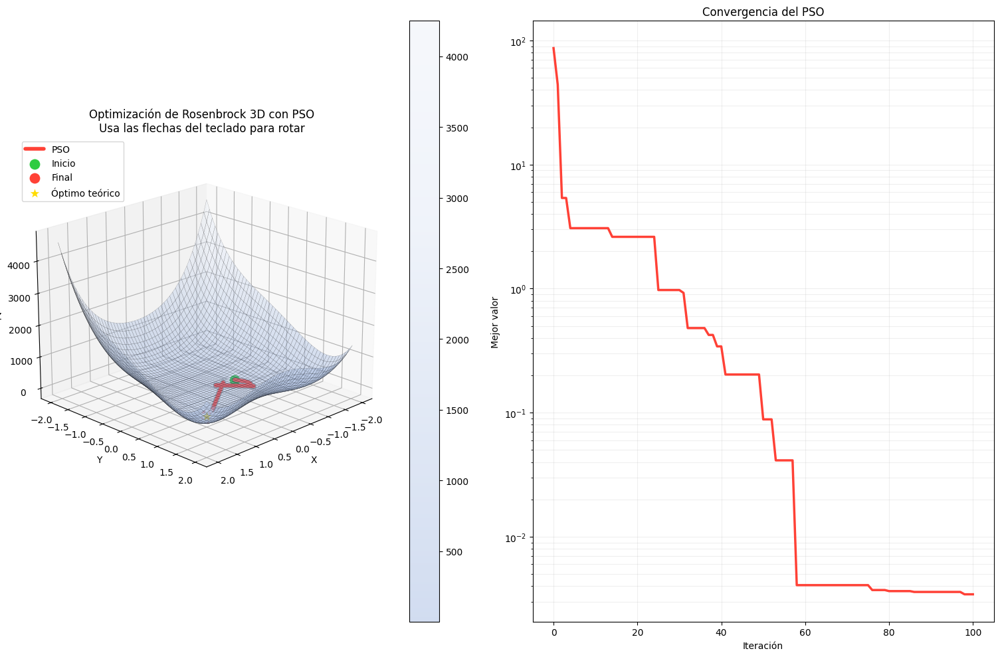

Resultados para Rosenbrock 3D:
Mejor solución encontrada: [0.97362938 0.94836392 0.89864131]
Mejor valor: 0.003435155223461531
Punto óptimo teórico: [1 1 1]
Distancia al óptimo: 0.11677019341122129


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import make_interp_spline

def rosenbrock_3d(x):
    """Función de Rosenbrock en 3D"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2 + (1-x[1])**2 + 100*(x[2]-x[1]**2)**2

class PSO:
    def __init__(self, objective_func, bounds, n_particles=50, w=0.7, c1=2.0, c2=2.0):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_particles = n_particles
        self.w = w  # Inercia
        self.c1 = c1  # Coeficiente cognitivo
        self.c2 = c2  # Coeficiente social
        self.dim = len(bounds)
        np.random.seed(42)  # Establecer una semilla para reproducibilidad

        # Inicializar partículas y velocidades
        self.positions = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_particles, self.dim)
        )

        self.velocities = np.random.uniform(
            low=[-0.1*(b[1]-b[0]) for b in bounds],
            high=[0.1*(b[1]-b[0]) for b in bounds],
            size=(n_particles, self.dim)
        )

        # Mejor posición personal y global
        self.p_best_positions = self.positions.copy()
        self.p_best_scores = np.array([self.objective_func(p) for p in self.positions])
        self.g_best_position = self.p_best_positions[np.argmin(self.p_best_scores)]
        self.g_best_score = np.min(self.p_best_scores)

        # Historial para visualización
        self.history = [self.g_best_position.copy()]
        self.score_history = [self.g_best_score]

    def optimize(self, n_iterations=100):
        for _ in range(n_iterations):
            # Actualizar velocidades
            r1, r2 = np.random.rand(2)
            self.velocities = (self.w * self.velocities +
                             self.c1 * r1 * (self.p_best_positions - self.positions) +
                             self.c2 * r2 * (self.g_best_position - self.positions))

            # Actualizar posiciones
            self.positions += self.velocities

            # Mantener partículas dentro de los límites
            for i in range(self.dim):
                self.positions[:, i] = np.clip(
                    self.positions[:, i],
                    self.bounds[i][0],
                    self.bounds[i][1]
                )

            # Evaluar nuevas posiciones
            scores = np.array([self.objective_func(p) for p in self.positions])

            # Actualizar mejores posiciones personales
            improved = scores < self.p_best_scores
            self.p_best_scores[improved] = scores[improved]
            self.p_best_positions[improved] = self.positions[improved]

            # Actualizar mejor posición global
            min_score_idx = np.argmin(scores)
            if scores[min_score_idx] < self.g_best_score:
                self.g_best_score = scores[min_score_idx]
                self.g_best_position = self.positions[min_score_idx].copy()

            self.history.append(self.g_best_position.copy())
            self.score_history.append(self.g_best_score)

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-2, 2), (-2, 2), (-2, 2)]  # Límites para Rosenbrock 3D
pso = PSO(rosenbrock_3d, bounds)
history, score_history = pso.optimize(n_iterations=100)

# Crear figura con subplots
fig = plt.figure(figsize=(15, 10))

def update_view(event):
    if event.key == 'left':
        ax.azim -= 10
    elif event.key == 'right':
        ax.azim += 10
    elif event.key == 'up':
        ax.elev += 10
    elif event.key == 'down':
        ax.elev -= 10
    fig.canvas.draw_idle()

# Crear un mapa de colores personalizado con colores más claros
colors = ['#8EA9DB', '#B4C7E7', '#D9E2F3', '#E9EEF7']
n_colors = 256
custom_cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_colors)

# Gráfica 3D de la trayectoria
ax = fig.add_subplot(121, projection='3d')

# Graficar la superficie con mayor transparencia
x = np.linspace(bounds[0][0], bounds[0][1], 50)
y = np.linspace(bounds[1][0], bounds[1][1], 50)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rosenbrock_3d([X[i,j], Y[i,j], history[-1, 2]])

surf = ax.plot_surface(X, Y, Z,
                      cmap=custom_cmap,
                      alpha=0.4,
                      linewidth=0.2,
                      edgecolor='black')
fig.colorbar(surf)

# Crear una trayectoria más suave usando interpolación
t = np.arange(len(history))
# Crear más puntos para la interpolación
t_smooth = np.linspace(0, len(history)-1, 300)

# Interpolar cada coordenada por separado
x_smooth = make_interp_spline(t, history[:, 0], k=3)(t_smooth)
y_smooth = make_interp_spline(t, history[:, 1], k=3)(t_smooth)
z_smooth = make_interp_spline(t, history[:, 2], k=3)(t_smooth)

# Graficar la trayectoria con efecto de sombra usando los puntos suavizados
ax.plot3D(x_smooth, y_smooth, z_smooth,
          color='black',
          linewidth=6.0,
          alpha=0.3,
          zorder=4,
          solid_capstyle='round')

# Línea principal más brillante y suave
ax.plot3D(x_smooth, y_smooth, z_smooth,
          color='#FF4136',
          linewidth=4.0,
          label='PSO',
          zorder=5,
          solid_capstyle='round')

# Puntos especiales con efectos mejorados
# Inicio
ax.scatter(history[0, 0], history[0, 1], history[0, 2],
          color='white',
          s=250,
          alpha=0.5,
          zorder=8)
ax.scatter(history[0, 0], history[0, 1], history[0, 2],
          color='#2ECC40',
          s=180,
          label='Inicio',
          edgecolor='white',
          linewidth=2,
          zorder=9)

# Final
ax.scatter(history[-1, 0], history[-1, 1], history[-1, 2],
          color='white',
          s=250,
          alpha=0.5,
          zorder=8)
ax.scatter(history[-1, 0], history[-1, 1], history[-1, 2],
          color='#FF4136',
          s=180,
          label='Final',
          edgecolor='white',
          linewidth=2,
          zorder=9)

# Punto óptimo teórico con efecto de brillo
optimal_point = np.array([1, 1, 1])
ax.scatter(optimal_point[0], optimal_point[1], optimal_point[2],
          color='white',
          s=350,
          alpha=0.5,
          zorder=8)
ax.scatter(optimal_point[0], optimal_point[1], optimal_point[2],
          color='#FFDC00',
          s=280,
          label='Óptimo teórico',
          edgecolor='white',
          linewidth=2,
          marker='*',
          zorder=9)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Optimización de Rosenbrock 3D con PSO\nUsa las flechas del teclado para rotar')
ax.legend(loc='upper left')

# Establecer vista inicial
ax.view_init(elev=20, azim=45)

# Gráfica de convergencia
ax2 = fig.add_subplot(122)
ax2.plot(score_history, color='#FF4136', linewidth=2.5)
ax2.set_xlabel('Iteración')
ax2.set_ylabel('Mejor valor')
ax2.set_title('Convergencia del PSO')
ax2.set_yscale('log')
ax2.grid(True, which="both", ls="-", alpha=0.2)

# Conectar el evento de teclado
fig.canvas.mpl_connect('key_press_event', update_view)

plt.tight_layout()
plt.show()

# Calcular la distancia al óptimo
distance_to_optimal = np.linalg.norm(history[-1] - optimal_point)

print("Resultados para Rosenbrock 3D:")
print(f"Mejor solución encontrada: {history[-1]}")
print(f"Mejor valor: {score_history[-1]}")
print(f"Punto óptimo teórico: {optimal_point}")
print(f"Distancia al óptimo: {distance_to_optimal}")

## Rastrigin

### 2D

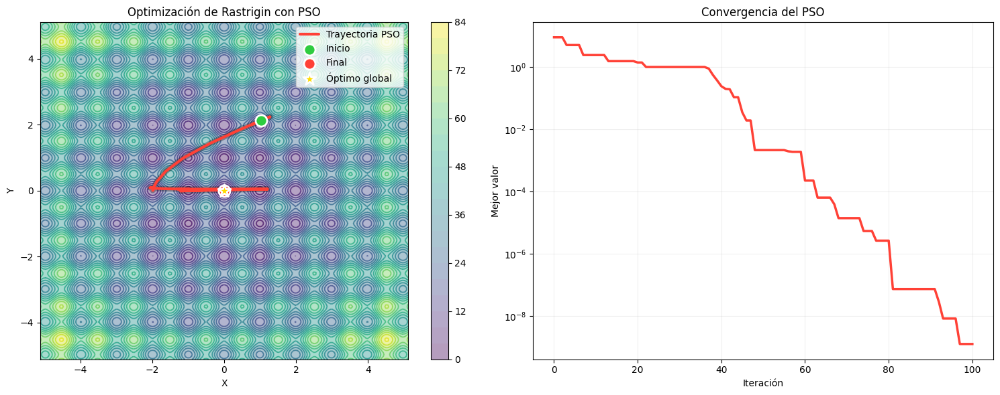


Resultados para Rastrigin 2D:
Mejor solución encontrada: [-1.04887533e-06 -2.28965223e-06]
Mejor valor: 1.2583285524669918e-09
Punto óptimo teórico: [0 0]
Distancia al óptimo: 2.518461197807679e-06


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import make_interp_spline

def rastrigin_2d(x):
    """Función de Rastrigin en 2D
    Mínimo global: f(0,0) = 0
    """
    return 20 + np.sum(x**2 - 10*np.cos(2*np.pi*x))

class PSO:
    def __init__(self, objective_func, bounds, n_particles=30, w=0.7, c1=1.5, c2=1.5):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_particles = n_particles
        self.w = w  # Inercia
        self.c1 = c1  # Coeficiente cognitivo
        self.c2 = c2  # Coeficiente social
        self.dim = len(bounds)
        np.random.seed(42)  # Establecer una semilla para reproducibilidad

        # Inicializar partículas y velocidades
        self.positions = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_particles, self.dim)
        )

        self.velocities = np.random.uniform(
            low=[-0.5*(b[1]-b[0]) for b in bounds],
            high=[0.5*(b[1]-b[0]) for b in bounds],
            size=(n_particles, self.dim)
        )

        # Mejor posición personal y global
        self.p_best_positions = self.positions.copy()
        self.p_best_scores = np.array([self.objective_func(p) for p in self.positions])
        self.g_best_position = self.p_best_positions[np.argmin(self.p_best_scores)]
        self.g_best_score = np.min(self.p_best_scores)

        # Historial para visualización
        self.history = [self.g_best_position.copy()]
        self.score_history = [self.g_best_score]

    def optimize(self, n_iterations=100):
        for _ in range(n_iterations):
            # Actualizar velocidades
            r1, r2 = np.random.rand(2)
            self.velocities = (self.w * self.velocities +
                             self.c1 * r1 * (self.p_best_positions - self.positions) +
                             self.c2 * r2 * (self.g_best_position - self.positions))

            # Limitar velocidades
            self.velocities = np.clip(
                self.velocities,
                [-0.5*(b[1]-b[0]) for b in self.bounds],
                [0.5*(b[1]-b[0]) for b in self.bounds]
            )

            # Actualizar posiciones
            self.positions += self.velocities

            # Mantener partículas dentro de los límites
            for i in range(self.dim):
                self.positions[:, i] = np.clip(
                    self.positions[:, i],
                    self.bounds[i][0],
                    self.bounds[i][1]
                )

            # Evaluar nuevas posiciones
            scores = np.array([self.objective_func(p) for p in self.positions])

            # Actualizar mejores posiciones personales
            improved = scores < self.p_best_scores
            self.p_best_scores[improved] = scores[improved]
            self.p_best_positions[improved] = self.positions[improved]

            # Actualizar mejor posición global
            min_score_idx = np.argmin(scores)
            if scores[min_score_idx] < self.g_best_score:
                self.g_best_score = scores[min_score_idx]
                self.g_best_position = self.positions[min_score_idx].copy()

            self.history.append(self.g_best_position.copy())
            self.score_history.append(self.g_best_score)

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-5.12, 5.12), (-5.12, 5.12)]  # Límites estándar para Rastrigin
pso = PSO(rastrigin_2d, bounds)
history, score_history = pso.optimize(n_iterations=100)

# Crear figura con subplots
fig = plt.figure(figsize=(15, 6))

# Crear un mapa de colores personalizado
colors = ['#1f77b4', '#7fcdbb', '#edf8b1']
custom_cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)

# Gráfica de contorno con trayectoria
ax1 = fig.add_subplot(121)

# Crear la malla para la función
x = np.linspace(bounds[0][0], bounds[0][1], 200)
y = np.linspace(bounds[1][0], bounds[1][1], 200)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)

for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rastrigin_2d(np.array([X[i,j], Y[i,j]]))

# Dibujar el contorno
contour = ax1.contour(X, Y, Z, levels=20, cmap='viridis', alpha=0.6)
contour_filled = ax1.contourf(X, Y, Z, levels=20, cmap='viridis', alpha=0.4)
fig.colorbar(contour_filled, ax=ax1)

# Crear una trayectoria más suave usando interpolación
t = np.arange(len(history))
t_smooth = np.linspace(0, len(history)-1, 300)

# Interpolar cada coordenada
x_smooth = make_interp_spline(t, history[:, 0], k=3)(t_smooth)
y_smooth = make_interp_spline(t, history[:, 1], k=3)(t_smooth)

# Graficar la trayectoria con efecto de sombra
ax1.plot(x_smooth, y_smooth,
         color='black',
         linewidth=6.0,
         alpha=0.3,
         zorder=4,
         solid_capstyle='round')

ax1.plot(x_smooth, y_smooth,
         color='#FF4136',
         linewidth=3.0,
         label='Trayectoria PSO',
         zorder=5,
         solid_capstyle='round')

# Puntos especiales
ax1.scatter(history[0, 0], history[0, 1],
           color='#2ECC40',
           s=150,
           label='Inicio',
           edgecolor='white',
           linewidth=2,
           zorder=6)

ax1.scatter(history[-1, 0], history[-1, 1],
           color='#FF4136',
           s=150,
           label='Final',
           edgecolor='white',
           linewidth=2,
           zorder=6)

ax1.scatter(0, 0,
           color='#FFDC00',
           s=200,
           label='Óptimo global',
           marker='*',
           edgecolor='white',
           linewidth=2,
           zorder=6)

ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_title('Optimización de Rastrigin con PSO')
ax1.legend()

# Gráfica de convergencia
ax2 = fig.add_subplot(122)
ax2.plot(score_history, color='#FF4136', linewidth=2.5)
ax2.set_xlabel('Iteración')
ax2.set_ylabel('Mejor valor')
ax2.set_title('Convergencia del PSO')
ax2.set_yscale('log')
ax2.grid(True, which="both", ls="-", alpha=0.2)

plt.tight_layout()
plt.show()

# Calcular la distancia al óptimo
optimal_point = np.array([0, 0])
distance_to_optimal = np.linalg.norm(history[-1] - optimal_point)

print("\nResultados para Rastrigin 2D:")
print(f"Mejor solución encontrada: {history[-1]}")
print(f"Mejor valor: {score_history[-1]}")
print(f"Punto óptimo teórico: {optimal_point}")
print(f"Distancia al óptimo: {distance_to_optimal}")

### Animación 2d

In [ ]:
def create_pso_animation(bounds=(-5.12, 5.12)):
    # Configuración y ejecución
    bounds = [bounds, bounds]  # Límites para Rastrigin
    pso = PSO(rastrigin_2d, bounds)
    particle_history, p_best_history, g_best_history, score_history = pso.optimize(n_iterations=100)

    # Crear la malla para la función
    x = np.linspace(bounds[0][0], bounds[0][1], 200)
    y = np.linspace(bounds[1][0], bounds[1][1], 200)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    for i in range(len(x)):
        for j in range(len(y)):
            Z[i,j] = rastrigin_2d(np.array([X[i,j], Y[i,j]]))

    # Configurar la figura para animación
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle('Optimización por Enjambre de Partículas - Función Rastrigin', fontsize=16)

    # Contorno de la función
    contour = ax1.contourf(X, Y, Z, levels=50, cmap='viridis', alpha=0.6)
    fig.colorbar(contour, ax=ax1)

    # Título de los subplots
    ax1.set_title('Exploración del Espacio de Búsqueda')
    ax2.set_title('Convergencia del Valor Óptimo')

    # Preparar líneas y puntos para la animación
    scatter = ax1.scatter(particle_history[0, :, 0], particle_history[0, :, 1],
                          c='red', alpha=0.7, label='Partículas')
    p_best_scatter = ax1.scatter(p_best_history[0, :, 0], p_best_history[0, :, 1],
                                 c='green', alpha=0.7, label='Mejores Personales')
    g_best_point, = ax1.plot(g_best_history[0, 0], g_best_history[0, 1],
                              'y*', markersize=15, label='Mejor Global')

    # Línea de convergencia
    line, = ax2.plot([], [], color='red', linewidth=2)
    ax2.set_xlim(0, len(score_history))
    ax2.set_ylim(min(score_history), max(score_history))
    ax2.set_xlabel('Iteración')
    ax2.set_ylabel('Mejor Valor')
    ax2.set_yscale('log')

    # Texto de información
    info_text = ax1.text(0.02, 0.98, '', transform=ax1.transAxes,
                         verticalalignment='top', fontsize=10)

    def animate(i):
        # Actualizar scatter de partículas
        scatter.set_offsets(particle_history[i, :, :2])

        # Actualizar mejores posiciones personales
        p_best_scatter.set_offsets(p_best_history[i, :, :2])

        # Actualizar mejor posición global
        g_best_point.set_data(g_best_history[i, 0], g_best_history[i, 1])

        # Actualizar línea de convergencia
        line.set_data(range(i+1), score_history[:i+1])

        # Actualizar texto de información
        info_text.set_text(f'Iteración: {i}\nMejor Valor: {score_history[i]:.4f}')

        return scatter, p_best_scatter, g_best_point, line, info_text

    # Crear animación
    anim = animation.FuncAnimation(fig, animate,
                                   frames=len(particle_history),
                                   interval=50,
                                   blit=True,
                                   repeat_delay=1000)

    plt.tight_layout()
    return anim

# Crear y guardar la animación
anim = create_pso_animation()
anim.save('pso_rastrigin_animation.gif', writer='pillow')
plt.close()

print("Animación guardada como 'pso_rastrigin_animation.gif'")

<ipython-input-65-ee89b70ac219>:57: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  g_best_point.set_data(g_best_history[i, 0], g_best_history[i, 1])
<ipython-input-65-ee89b70ac219>:57: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  g_best_point.set_data(g_best_history[i, 0], g_best_history[i, 1])


Animación guardada como 'pso_rastrigin_animation.gif'


###3D

Mostrando diferentes perspectivas de la visualización:


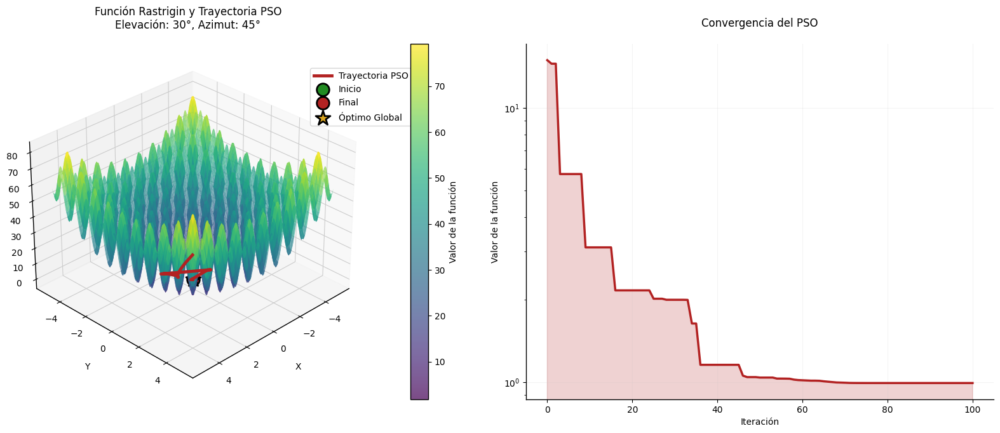

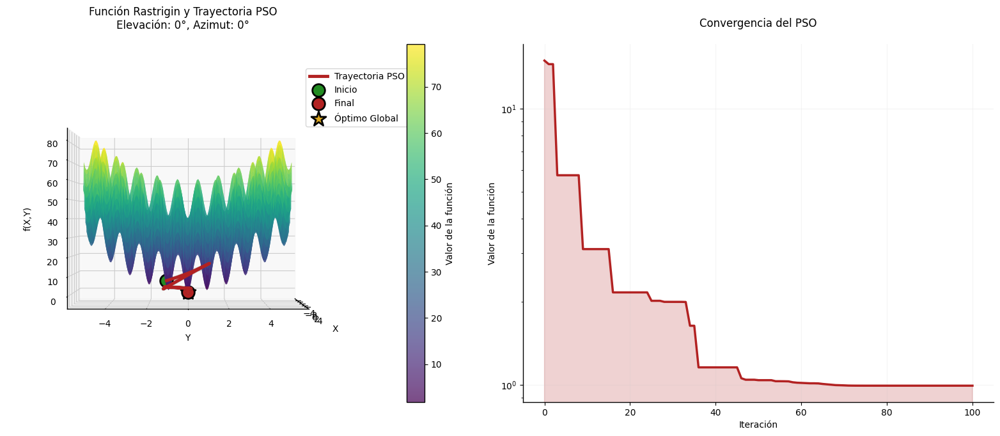

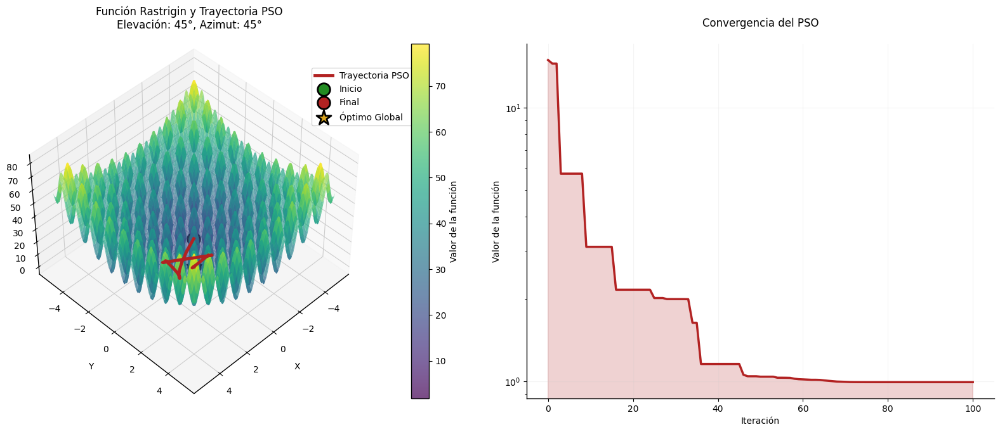

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import make_interp_spline

def plot_rastrigin_3d(history, score_history, elev=30, azim=45):
    plt.style.use('default')
    plt.rcParams.update({
        'figure.facecolor': 'white',
        'axes.facecolor': 'white',
        'axes.grid': True,
        'grid.alpha': 0.2,
        'grid.color': '#cccccc',
        'axes.linewidth': 1.0,
    })

    fig = plt.figure(figsize=(16, 7))
    ax1 = fig.add_subplot(121, projection='3d')

    # Crear malla para la superficie
    x = np.linspace(-5.12, 5.12, 150)
    y = np.linspace(-5.12, 5.12, 150)
    X, Y = np.meshgrid(x, y)
    Z = rastrigin(X, Y)

    # Graficar superficie
    surf = ax1.plot_surface(X, Y, Z,
                           cmap='viridis',
                           alpha=0.7,
                           linewidth=0,
                           antialiased=True,
                           rstride=2,
                           cstride=2)

    # Calcular puntos de la trayectoria
    z_points = [rastrigin(point[0], point[1]) for point in history]

    # Suavizar la trayectoria
    t = np.arange(len(history))
    t_smooth = np.linspace(0, len(history)-1, 400)
    x_smooth = make_interp_spline(t, history[:, 0], k=3)(t_smooth)
    y_smooth = make_interp_spline(t, history[:, 1], k=3)(t_smooth)
    z_smooth = make_interp_spline(t, z_points, k=3)(t_smooth)

    # Efecto de sombra para la trayectoria con color más suave
    for offset in [-0.2, -0.1, 0, 0.1, 0.2]:
        ax1.plot3D(x_smooth, y_smooth, z_smooth + offset,
                   color='#404040',  # Gris oscuro para la sombra
                   linewidth=4,
                   alpha=0.1,
                   zorder=5)

    # Trayectoria principal con color más asentado
    trajectory_color = '#B22222'  # Rojo oscuro más profesional
    ax1.plot3D(x_smooth, y_smooth, z_smooth,
               color=trajectory_color,
               linewidth=3.5,
               label='Trayectoria PSO',
               zorder=6)

    # Puntos importantes con colores coordinados
    ax1.scatter(history[0, 0], history[0, 1], z_points[0],
                color='#228B22',  # Verde bosque
                s=200,
                label='Inicio',
                zorder=7,
                edgecolor='black',
                linewidth=2)

    ax1.scatter(history[-1, 0], history[-1, 1], z_points[-1],
                color=trajectory_color,  # Mismo color que la trayectoria
                s=200,
                label='Final',
                zorder=7,
                edgecolor='black',
                linewidth=2)

    ax1.scatter(0, 0, rastrigin(0, 0),
                color='#DAA520',  # Dorado más suave
                s=300,
                label='Óptimo Global',
                marker='*',
                edgecolor='black',
                linewidth=2,
                zorder=7)

    # Configurar la vista
    ax1.view_init(elev=elev, azim=azim)
    ax1.dist = 9

    # Etiquetas y título
    ax1.set_xlabel('X', labelpad=10)
    ax1.set_ylabel('Y', labelpad=10)
    ax1.set_zlabel('f(X,Y)', labelpad=10)
    ax1.set_title(f'Función Rastrigin y Trayectoria PSO\nElevación: {elev}°, Azimut: {azim}°',
                  pad=20, fontsize=12)
    ax1.legend(loc='upper right', bbox_to_anchor=(1.15, 0.95))

    # Barra de color
    cbar = fig.colorbar(surf, ax=ax1, label='Valor de la función', pad=0.1)

    # Gráfico de convergencia con el mismo color asentado
    ax2 = fig.add_subplot(122)
    ax2.plot(score_history, color=trajectory_color, linewidth=2.5)
    ax2.fill_between(range(len(score_history)), score_history,
                     alpha=0.2, color=trajectory_color)

    ax2.set_xlabel('Iteración', fontsize=10)
    ax2.set_ylabel('Valor de la función', fontsize=10)
    ax2.set_title('Convergencia del PSO', pad=20, fontsize=12)
    ax2.set_yscale('log')
    ax2.grid(True, alpha=0.2)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)

    plt.tight_layout(pad=2.0)
    plt.show()

# Ejecutar PSO
bounds = [(-5.12, 5.12), (-5.12, 5.12), (-5.12, 5.12)]
pso = PSO(rastrigin_vector, bounds, n_particles=50)
history, score_history = pso.optimize(n_iterations=100)

# Mostrar diferentes vistas
print("Mostrando diferentes perspectivas de la visualización:")

# Vista por defecto (ligero ángulo)
plot_rastrigin_3d(history, score_history, elev=30, azim=45)

# Vista lateral
plot_rastrigin_3d(history, score_history, elev=0, azim=0)

# Vista isométrica
plot_rastrigin_3d(history, score_history, elev=45, azim=45)

#Evolucion diferencial

## Rosenbrock

### 2D

Resultados para Rosenbrock:
Mejor solución: [1.00029468 1.00059122]
Mejor valor: 8.715095469136489e-08


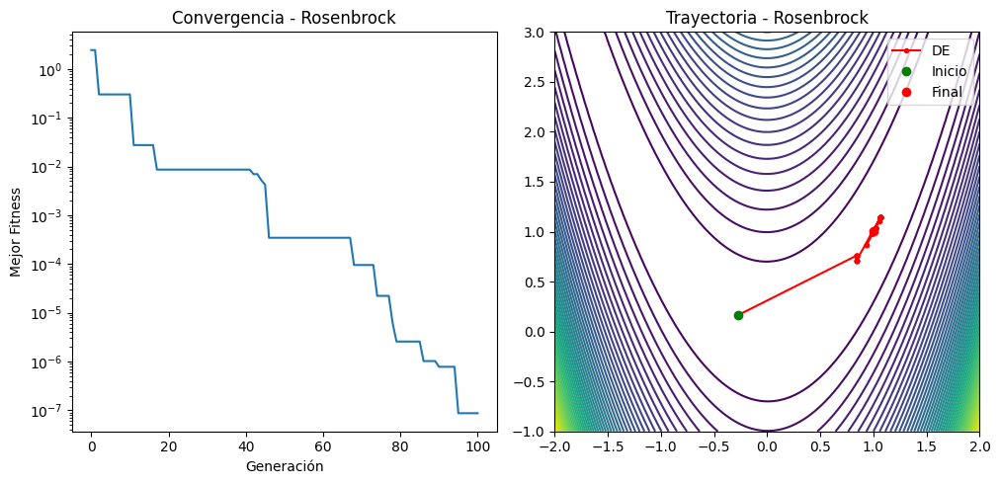

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock(x):
    """Función de Rosenbrock"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2

class DE:
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f  # Factor de escalado
        self.cr = cr  # Probabilidad de cruce
        self.dim = len(bounds)
        np.random.seed(42)

        # Inicializar población
        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        # Evaluar población inicial
        self.scores = np.array([self.objective_func(ind) for ind in self.population])

        # Mejor individuo y su fitness
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        # Historial para visualización
        self.history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for _ in range(n_generations):
            for i in range(self.n_individuals):
                # Seleccionar individuos aleatorios diferentes a i
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                # Generar individuo de prueba
                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                # Mantener individuo dentro de los límites
                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                # Evaluar individuo de prueba
                trial_score = self.objective_func(trial)

                # Reemplazar si mejora
                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    # Actualizar mejor individuo
                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            self.history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-2, 2), (-1, 3)]  # Límites para Rosenbrock
de = DE(rosenbrock, bounds)
history, score_history = de.optimize(n_generations=100)

# Visualización (similar a PSO)
fig = plt.figure(figsize=(15, 5))

ax1 = fig.add_subplot(131)
ax1.plot(score_history)
ax1.set_yscale('log')
ax1.set_xlabel('Generación')
ax1.set_ylabel('Mejor Fitness')
ax1.set_title('Convergencia - Rosenbrock')

ax2 = fig.add_subplot(132)
x = np.linspace(bounds[0][0], bounds[0][1], 100)
y = np.linspace(bounds[1][0], bounds[1][1], 100)
X, Y = np.meshgrid(x, y)
Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

ax2.contour(X, Y, Z, levels=50)
ax2.plot(history[:, 0], history[:, 1], 'r.-', label='DE')
ax2.plot(history[0, 0], history[0, 1], 'go', label='Inicio')
ax2.plot(history[-1, 0], history[-1, 1], 'ro', label='Final')
ax2.set_title('Trayectoria - Rosenbrock')
ax2.legend()



plt.tight_layout()

print("Resultados para Rosenbrock:")
print(f"Mejor solución: {history[-1]}")
print(f"Mejor valor: {score_history[-1]}")

### Animación 2d

<ipython-input-83-5d431d9015a0>:142: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  best_point.set_data(best_history[i][0], best_history[i][1])


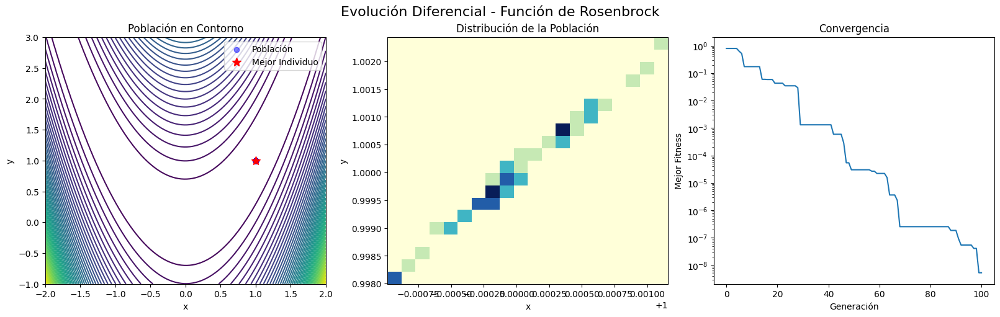

Resultados para Rosenbrock:
Mejor solución: [0.99998494 0.99997705]
Mejor valor: 5.37719854330179e-09


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock(x):
    """Función de Rosenbrock"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2

class DE:
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f  # Factor de escalado
        self.cr = cr  # Probabilidad de cruce
        self.dim = len(bounds)

        # Inicializar población
        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        # Evaluar población inicial
        self.scores = np.array([self.objective_func(ind) for ind in self.population])

        # Mejor individuo y su fitness
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        # Historial para visualización
        self.population_history = [self.population.copy()]
        self.best_history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for _ in range(n_generations):
            for i in range(self.n_individuals):
                # Seleccionar individuos aleatorios diferentes a i
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                # Generar individuo de prueba
                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                # Mantener individuo dentro de los límites
                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                # Evaluar individuo de prueba
                trial_score = self.objective_func(trial)

                # Reemplazar si mejora
                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    # Actualizar mejor individuo
                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            # Guardar estado de cada generación
            self.population_history.append(self.population.copy())
            self.best_history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

        return (np.array(self.population_history),
                np.array(self.best_history),
                np.array(self.score_history))

# Configuración de la animación
bounds = [(-2, 2), (-1, 3)]  # Límites para Rosenbrock
de = DE(rosenbrock, bounds)
population_history, best_history, score_history = de.optimize(n_generations=100)

# Preparar la visualización
fig = plt.figure(figsize=(16, 5), constrained_layout=True)
fig.suptitle('Evolución Diferencial - Función de Rosenbrock', fontsize=16)

# Crear subplots
gs = fig.add_gridspec(1, 3)

# Subplot para el contorno
ax_contour = fig.add_subplot(gs[0, 0])

# Subplot para la población
ax_population = fig.add_subplot(gs[0, 1])

# Subplot para la convergencia
ax_convergence = fig.add_subplot(gs[0, 2])

# Preparar datos para el contorno
x = np.linspace(bounds[0][0], bounds[0][1], 100)
y = np.linspace(bounds[1][0], bounds[1][1], 100)
X, Y = np.meshgrid(x, y)
Z = np.array([[rosenbrock([xi, yi]) for xi in x] for yi in y])

# Dibujar contorno base
contour = ax_contour.contour(X, Y, Z, levels=50)
ax_contour.set_title('Población en Contorno')
ax_contour.set_xlabel('x')
ax_contour.set_ylabel('y')

# Preparar líneas de población y mejores individuos
population_scatter = ax_contour.scatter([], [], c='blue', alpha=0.5, label='Población')
best_point, = ax_contour.plot([], [], 'r*', markersize=10, label='Mejor Individuo')
ax_contour.legend()

# Preparar línea de convergencia
convergence_line, = ax_convergence.semilogy([], [])
ax_convergence.set_title('Convergencia')
ax_convergence.set_xlabel('Generación')
ax_convergence.set_ylabel('Mejor Fitness')

# Preparar histograma de la población
population_hist = ax_population.hist2d([], [], bins=20, cmap='YlGnBu')
ax_population.set_title('Distribución de la Población')
ax_population.set_xlabel('x')
ax_population.set_ylabel('y')

def init():
    population_scatter.set_offsets(np.empty((0, 2)))
    best_point.set_data([], [])
    convergence_line.set_data([], [])
    return population_scatter, best_point, convergence_line

def animate(i):
    # Actualizar scatter de población
    current_population = population_history[i]
    population_scatter.set_offsets(current_population)

    # Actualizar mejor punto
    best_point.set_data(best_history[i][0], best_history[i][1])

    # Actualizar convergencia
    convergence_line.set_data(range(i+1), score_history[:i+1])
    ax_convergence.relim()
    ax_convergence.autoscale_view()

    # Actualizar histograma 2D
    ax_population.clear()
    ax_population.set_title('Distribución de la Población')
    ax_population.set_xlabel('x')
    ax_population.set_ylabel('y')
    ax_population.hist2d(current_population[:, 0], current_population[:, 1], bins=20, cmap='YlGnBu')

    return population_scatter, best_point, convergence_line

# Crear animación
anim = animation.FuncAnimation(fig, animate, init_func=init,
                                frames=len(population_history),
                                interval=100, blit=False)

anim.save('differential_evolution_rosenbrock.gif', writer='pillow')

plt.show()

print("Resultados para Rosenbrock:")
print(f"Mejor solución: {best_history[-1]}")
print(f"Mejor valor: {score_history[-1]}")

###3D

Resultados para Rosenbrock 3D:
Mejor solución: [0.97766505 0.95140806 0.89935993]
Mejor valor: 0.00819862364829818


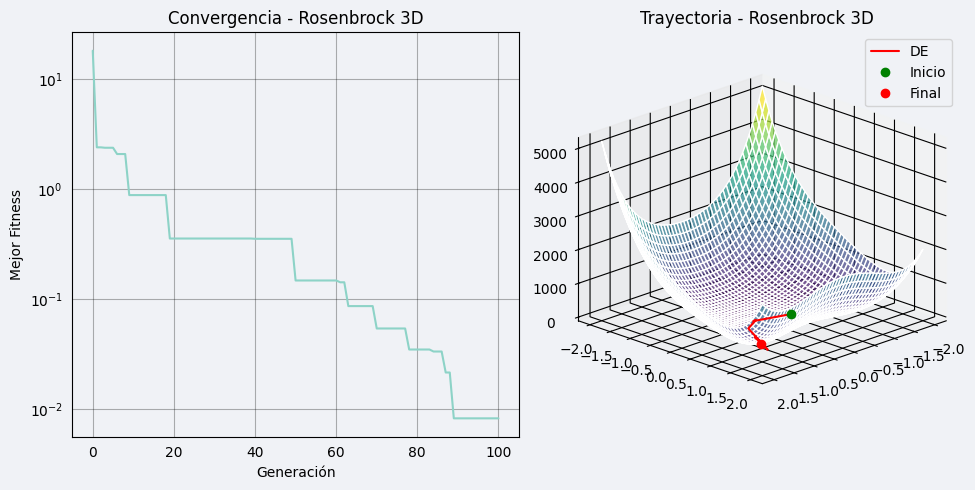

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rosenbrock_3d(x):
    """Función de Rosenbrock en 3D"""
    return (1-x[0])**2 + 100*(x[1]-x[0]**2)**2 + (1-x[1])**2 + 100*(x[2]-x[1]**2)**2

class DE:
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f  # Factor de escalado
        self.cr = cr  # Probabilidad de cruce
        self.dim = len(bounds)

        # Inicializar población
        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        # Evaluar población inicial
        self.scores = np.array([self.objective_func(ind) for ind in self.population])

        # Mejor individuo y su fitness
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        # Historial para visualización
        self.history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for _ in range(n_generations):
            for i in range(self.n_individuals):
                # Seleccionar individuos aleatorios diferentes a i
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                # Generar individuo de prueba
                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                # Mantener individuo dentro de los límites
                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                # Evaluar individuo de prueba
                trial_score = self.objective_func(trial)

                # Reemplazar si mejora
                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    # Actualizar mejor individuo
                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            self.history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-2, 2), (-2, 2), (-2, 2)]  # Límites para Rosenbrock 3D
de = DE(rosenbrock_3d, bounds)
history, score_history = de.optimize(n_generations=100)

# Creación de la superficie de Rosenbrock 3D
x = np.linspace(bounds[0][0], bounds[0][1], 50)
y = np.linspace(bounds[1][0], bounds[1][1], 50)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        Z[i, j] = rosenbrock_3d([X[i, j], Y[i, j], 0])

# ... (código anterior sin cambios) ...

# Visualización
fig = plt.figure(figsize=(10, 5))

ax1 = fig.add_subplot(121)
ax1.plot(score_history)
ax1.set_yscale('log')
ax1.set_xlabel('Generación')
ax1.set_ylabel('Mejor Fitness')
ax1.set_title('Convergencia - Rosenbrock 3D')

ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)
ax2.plot3D(history[:, 0], history[:, 1], history[:, 2], 'r-', label='DE')
ax2.plot(history[0, 0], history[0, 1], history[0, 2], 'go', label='Inicio')
ax2.plot(history[-1, 0], history[-1, 1], history[-1, 2], 'ro', label='Final')
ax2.set_title('Trayectoria - Rosenbrock 3D')
ax2.legend()

# Configuración de la vista
ax2.view_init(elev=20, azim=45)  # Ajusta la elevación y el azimut
ax2.set_proj_type('ortho')  # Establece la proyección ortográfica

plt.tight_layout()

print("Resultados para Rosenbrock 3D:")
print(f"Mejor solución: {history[-1]}")
print(f"Mejor valor: {score_history[-1]}")

Mostrando diferentes perspectivas de la visualización:


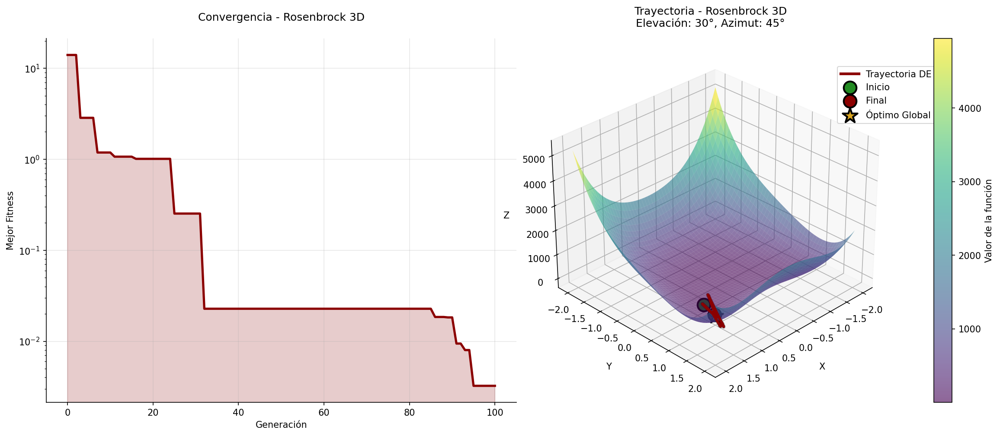

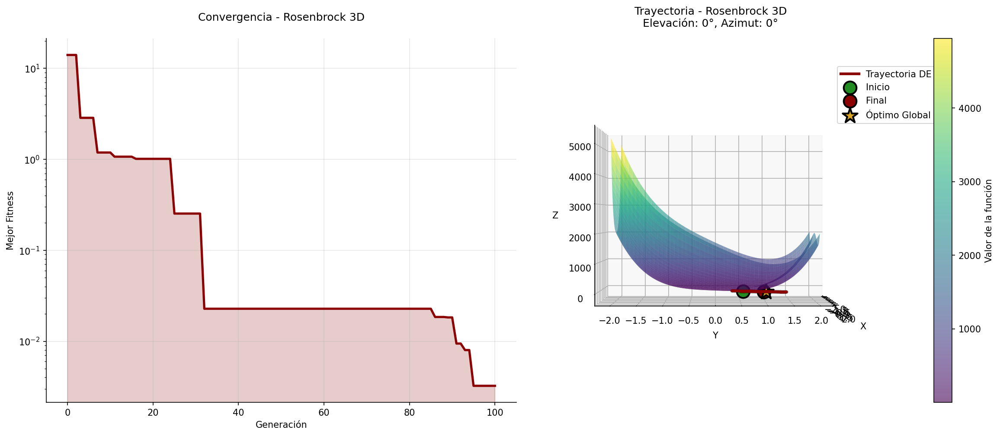

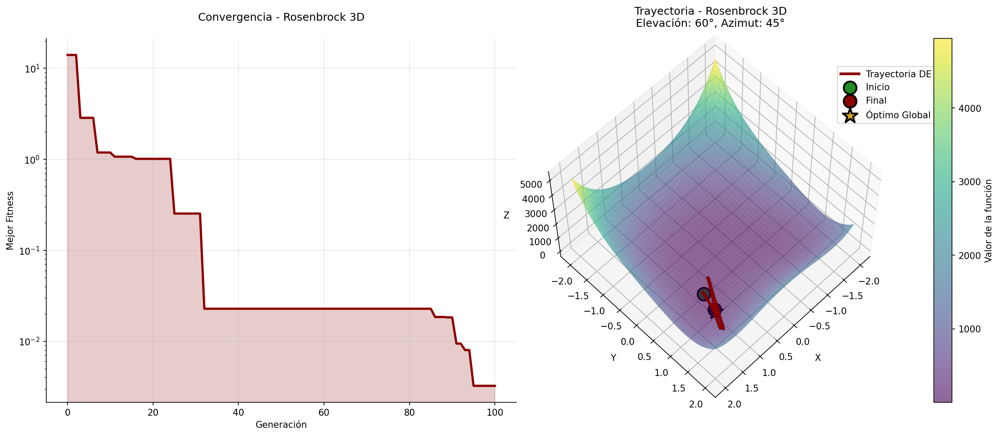


Resultados para Rosenbrock 3D:
Mejor solución encontrada: [0.976361, 0.953529, 0.911490]
Mejor valor: 0.003240
Distancia al óptimo: 0.102725


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import make_interp_spline

def plot_rosenbrock_3d(history, score_history, elev=30, azim=45):
    plt.style.use('default')
    plt.rcParams.update({
        'figure.facecolor': 'white',
        'axes.facecolor': 'white',
        'axes.grid': True,
        'grid.alpha': 0.2,
        'figure.dpi': 150
    })

    fig = plt.figure(figsize=(16, 7))

    # Gráfico de convergencia
    ax1 = fig.add_subplot(121)
    convergence_color = '#8B0000'  # Rojo oscuro
    ax1.plot(score_history, color=convergence_color, linewidth=2.5)
    ax1.fill_between(range(len(score_history)), score_history,
                     alpha=0.2, color=convergence_color)
    ax1.set_yscale('log')
    ax1.set_xlabel('Generación', fontsize=10)
    ax1.set_ylabel('Mejor Fitness', fontsize=10)
    ax1.set_title('Convergencia - Rosenbrock 3D', pad=20, fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Superficie y trayectoria 3D
    ax2 = fig.add_subplot(122, projection='3d')

    # Crear superficie más detallada
    x = np.linspace(bounds[0][0], bounds[0][1], 100)  # Aumentado de 50 a 100 puntos
    y = np.linspace(bounds[1][0], bounds[1][1], 100)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = rosenbrock_3d([X[i, j], Y[i, j], 0])

    # Graficar superficie con colores más suaves
    surf = ax2.plot_surface(X, Y, Z,
                           cmap='viridis',
                           alpha=0.6,
                           linewidth=0,
                           antialiased=True,
                           rstride=2,
                           cstride=2)

    # Suavizar la trayectoria
    t = np.arange(len(history))
    t_smooth = np.linspace(0, len(history)-1, 400)
    x_smooth = make_interp_spline(t, history[:, 0], k=3)(t_smooth)
    y_smooth = make_interp_spline(t, history[:, 1], k=3)(t_smooth)
    z_smooth = make_interp_spline(t, history[:, 2], k=3)(t_smooth)

    # Efecto de sombra para la trayectoria
    for offset in [-0.2, -0.1, 0, 0.1, 0.2]:
        ax2.plot3D(x_smooth, y_smooth, z_smooth + offset,
                   color='black',
                   linewidth=4,
                   alpha=0.1,
                   zorder=5)

    # Trayectoria principal
    trajectory_color = '#8B0000'  # Rojo oscuro para la trayectoria
    ax2.plot3D(x_smooth, y_smooth, z_smooth,
               color=trajectory_color,
               linewidth=3,
               label='Trayectoria DE',
               zorder=6)

    # Puntos importantes
    ax2.scatter(history[0, 0], history[0, 1], history[0, 2],
                color='#228B22',  # Verde oscuro
                s=200,
                label='Inicio',
                zorder=7,
                edgecolor='black',
                linewidth=2)

    ax2.scatter(history[-1, 0], history[-1, 1], history[-1, 2],
                color=trajectory_color,
                s=200,
                label='Final',
                zorder=7,
                edgecolor='black',
                linewidth=2)

    # Punto óptimo (1,1,1) para Rosenbrock
    ax2.scatter(1, 1, 1,
                color='#DAA520',  # Dorado
                s=300,
                label='Óptimo Global',
                marker='*',
                edgecolor='black',
                linewidth=2,
                zorder=7)

    # Configuración de la vista
    ax2.view_init(elev=elev, azim=azim)
    ax2.set_title(f'Trayectoria - Rosenbrock 3D\nElevación: {elev}°, Azimut: {azim}°',
                  pad=20, fontsize=12)

    # Etiquetas de ejes
    ax2.set_xlabel('X', labelpad=10)
    ax2.set_ylabel('Y', labelpad=10)
    ax2.set_zlabel('Z', labelpad=10)

    # Leyenda y barra de color
    ax2.legend(loc='upper right', bbox_to_anchor=(1.15, 0.95))
    fig.colorbar(surf, ax=ax2, pad=0.1, label='Valor de la función')

    plt.tight_layout(pad=2.0)
    plt.show()

# Configuración y ejecución
bounds = [(-2, 2), (-2, 2), (-2, 2)]
de = DE(rosenbrock_3d, bounds)
history, score_history = de.optimize(n_generations=100)

# Mostrar diferentes vistas
print("Mostrando diferentes perspectivas de la visualización:")

# Vista por defecto (ángulo equilibrado)
plot_rosenbrock_3d(history, score_history, elev=30, azim=45)

# Vista lateral
plot_rosenbrock_3d(history, score_history, elev=0, azim=0)

# Vista desde arriba con ligera inclinación
plot_rosenbrock_3d(history, score_history, elev=60, azim=45)

# Imprimir resultados
print("\nResultados para Rosenbrock 3D:")
print("=" * 50)
print(f"Mejor solución encontrada: [{', '.join([f'{x:.6f}' for x in history[-1]])}]")
print(f"Mejor valor: {score_history[-1]:.6f}")
print(f"Distancia al óptimo: {np.linalg.norm(history[-1] - np.array([1,1,1])):.6f}")
print("=" * 50)

## Rastrigin

### 2D

Generación 0: Mejor fitness = 4.201927
Generación 10: Mejor fitness = 0.919715
Generación 20: Mejor fitness = 0.919715
Generación 30: Mejor fitness = 0.235414
Generación 40: Mejor fitness = 0.052098
Generación 50: Mejor fitness = 0.002280
Generación 60: Mejor fitness = 0.000179
Generación 70: Mejor fitness = 0.000002
Generación 80: Mejor fitness = 0.000000
Generación 90: Mejor fitness = 0.000000
Generación 100: Mejor fitness = 0.000000
Generación 110: Mejor fitness = 0.000000
Generación 120: Mejor fitness = 0.000000
Generación 130: Mejor fitness = 0.000000
Generación 140: Mejor fitness = 0.000000


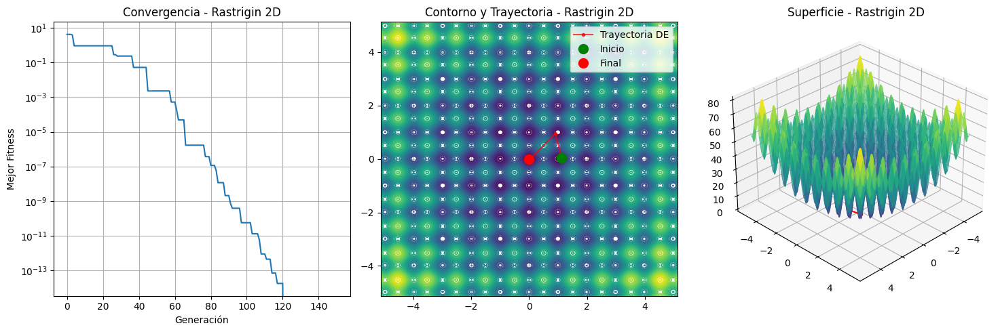


Resultados para Rastrigin 2D:
Mejor solución encontrada: (-0.000000, -0.000000)
Mejor valor de fitness: 0.000000
Distancia al óptimo global (0,0): 0.000000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

def rastrigin_2d(x):
    """Función de Rastrigin en 2D
    El mínimo global está en f(0,0) = 0
    """
    return 20 + sum([(xi**2 - 10 * np.cos(2 * np.pi * xi)) for xi in x])

class DE:
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f  # Factor de escalado
        self.cr = cr  # Probabilidad de cruce
        self.dim = len(bounds)

        # Inicializar población
        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        # Evaluar población inicial
        self.scores = np.array([self.objective_func(ind) for ind in self.population])

        # Mejor individuo y su fitness
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        # Historial para visualización
        self.history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for gen in range(n_generations):
            for i in range(self.n_individuals):
                # Seleccionar individuos aleatorios diferentes a i
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                # Generar individuo de prueba
                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                # Mantener individuo dentro de los límites
                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                # Evaluar individuo de prueba
                trial_score = self.objective_func(trial)

                # Reemplazar si mejora
                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    # Actualizar mejor individuo
                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            self.history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

            # Opcional: imprimir progreso cada 10 generaciones
            if gen % 10 == 0:
                print(f"Generación {gen}: Mejor fitness = {self.best_score:.6f}")

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-5.12, 5.12), (-5.12, 5.12)]  # Límites típicos para Rastrigin
de = DE(rastrigin_2d, bounds, n_individuals=100, f=0.8, cr=0.9)
history, score_history = de.optimize(n_generations=150)

# Visualización
fig = plt.figure(figsize=(15, 5))

# Gráfica de convergencia
ax1 = fig.add_subplot(131)
ax1.plot(score_history)
ax1.set_yscale('log')
ax1.set_xlabel('Generación')
ax1.set_ylabel('Mejor Fitness')
ax1.set_title('Convergencia - Rastrigin 2D')
ax1.grid(True)

# Visualización del espacio de búsqueda y trayectoria
ax2 = fig.add_subplot(132)
x = np.linspace(bounds[0][0], bounds[0][1], 200)
y = np.linspace(bounds[1][0], bounds[1][1], 200)
X, Y = np.meshgrid(x, y)
Z = np.array([[rastrigin_2d([xi, yi]) for xi in x] for yi in y])

contour = ax2.contour(X, Y, Z, levels=50)
ax2.plot(history[:, 0], history[:, 1], 'r.-', label='Trayectoria DE', alpha=0.7)
ax2.plot(history[0, 0], history[0, 1], 'go', label='Inicio', markersize=10)
ax2.plot(history[-1, 0], history[-1, 1], 'ro', label='Final', markersize=10)
ax2.set_title('Contorno y Trayectoria - Rastrigin 2D')
ax2.legend()
ax2.grid(True)

# Vista 3D de la función
ax3 = fig.add_subplot(133, projection='3d')
surf = ax3.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
ax3.plot3D(history[:, 0], history[:, 1], score_history, 'r.-', label='Trayectoria DE')
ax3.set_title('Superficie - Rastrigin 2D')
ax3.view_init(elev=30, azim=45)

plt.tight_layout()
plt.show()

print("\nResultados para Rastrigin 2D:")
print(f"Mejor solución encontrada: ({history[-1][0]:.6f}, {history[-1][1]:.6f})")
print(f"Mejor valor de fitness: {score_history[-1]:.6f}")
print(f"Distancia al óptimo global (0,0): {np.linalg.norm(history[-1]):.6f}")

###3D


Resultados para Rastrigin 3D:
Mejor solución encontrada: [-2.14340182e-07  1.17307720e-07 -1.52425703e-07]
Mejor valor de fitness: 1.645616976020392e-11


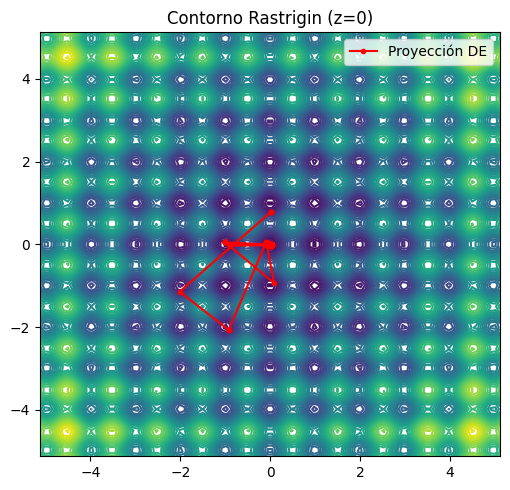

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

np.random.seed(42)

def rastrigin(x):
    """Función de Rastrigin en 3D
    El mínimo global está en f(0,0,0) = 0
    """
    n = len(x)
    return 10 * n + sum([(xi**2 - 10 * np.cos(2 * np.pi * xi)) for xi in x])

class DE:
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f  # Factor de escalado
        self.cr = cr  # Probabilidad de cruce
        self.dim = len(bounds)

        # Inicializar población
        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        # Evaluar población inicial
        self.scores = np.array([self.objective_func(ind) for ind in self.population])

        # Mejor individuo y su fitness
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        # Historial para visualización
        self.history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for _ in range(n_generations):
            for i in range(self.n_individuals):
                # Seleccionar individuos aleatorios diferentes a i
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                # Generar individuo de prueba
                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                # Mantener individuo dentro de los límites
                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                # Evaluar individuo de prueba
                trial_score = self.objective_func(trial)

                # Reemplazar si mejora
                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    # Actualizar mejor individuo
                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            self.history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

        return np.array(self.history), np.array(self.score_history)

# Configuración y ejecución
bounds = [(-5.12, 5.12), (-5.12, 5.12), (-5.12, 5.12)]  # Límites típicos para Rastrigin
de = DE(rastrigin, bounds, n_individuals=100, f=0.8, cr=0.9)
history, score_history = de.optimize(n_generations=200)

# Visualización
fig = plt.figure(figsize=(15, 5))



# Visualización de la función Rastrigin (corte en z=0)
ax3 = fig.add_subplot(133)
x = np.linspace(bounds[0][0], bounds[0][1], 100)
y = np.linspace(bounds[1][0], bounds[1][1], 100)
X, Y = np.meshgrid(x, y)
Z = np.zeros_like(X)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rastrigin([X[i,j], Y[i,j], 0])

contour = ax3.contour(X, Y, Z, levels=50)
ax3.plot(history[:, 0], history[:, 1], 'r.-', label='Proyección DE')
ax3.set_title('Contorno Rastrigin (z=0)')
ax3.legend()

plt.tight_layout()

print("\nResultados para Rastrigin 3D:")
print(f"Mejor solución encontrada: {history[-1]}")
print(f"Mejor valor de fitness: {score_history[-1]}")

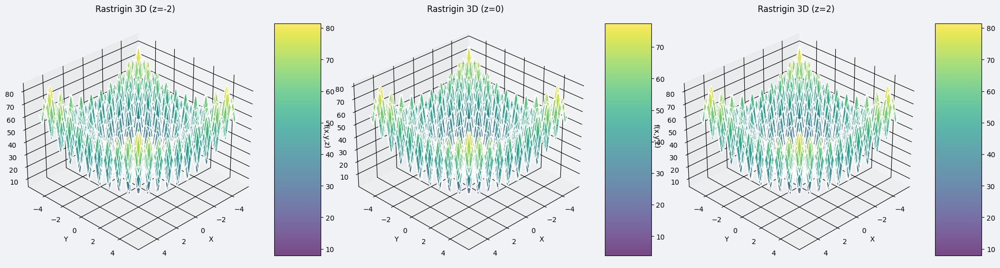

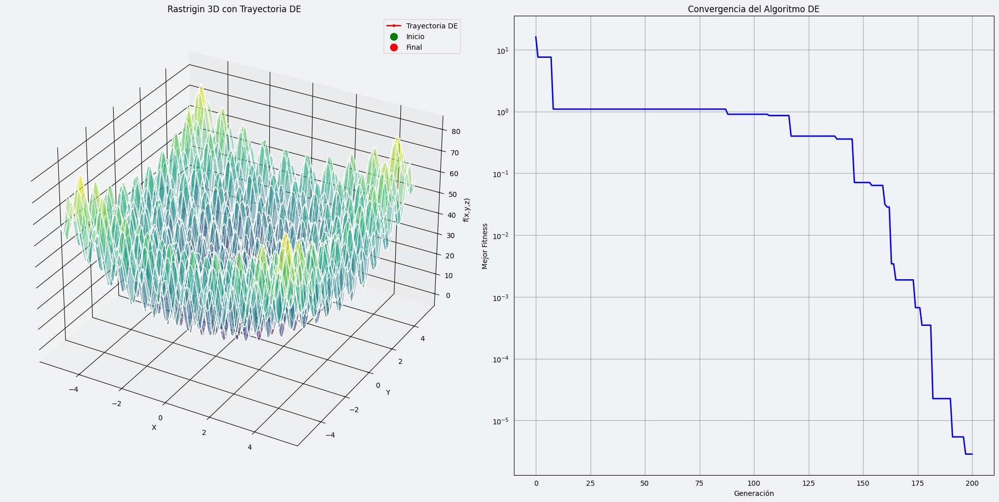


Resultados finales:
Mejor solución encontrada: [1.62208525e-06 5.11280156e-05 1.08557305e-04]
Mejor valor de fitness: 2.8571224426343633e-06


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def rastrigin(x):
    """Función de Rastrigin en 3D"""
    n = len(x)
    return 10 * n + sum([(xi**2 - 10 * np.cos(2 * np.pi * xi)) for xi in x])

# Crear datos para la visualización 3D
x = np.linspace(-5.12, 5.12, 100)
y = np.linspace(-5.12, 5.12, 100)
X, Y = np.meshgrid(x, y)

# Calcular Z para diferentes valores de la tercera dimensión
z_levels = [-2, 0, 2]  # Valores de z donde queremos ver los cortes
fig = plt.figure(figsize=(20, 10))

# Crear subplots para diferentes vistas
for i, z_val in enumerate(z_levels):
    ax = fig.add_subplot(1, len(z_levels), i+1, projection='3d')

    # Calcular la función Rastrigin para este nivel de z
    Z = np.zeros_like(X)
    for i in range(len(x)):
        for j in range(len(y)):
            Z[i,j] = rastrigin([X[i,j], Y[i,j], z_val])

    # Graficar la superficie
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.7)

    # Configurar la vista
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('f(x,y,z)')
    ax.set_title(f'Rastrigin 3D (z={z_val})')

    # Añadir barra de color
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

    # Ajustar el ángulo de vista
    ax.view_init(elev=30, azim=45)

plt.tight_layout()
plt.show()

# Ahora vamos a ejecutar DE y visualizar la trayectoria
class DE:
    # [Mantener la implementación anterior de la clase DE]
    def __init__(self, objective_func, bounds, n_individuals=50, f=0.8, cr=0.7):
        self.objective_func = objective_func
        self.bounds = bounds
        self.n_individuals = n_individuals
        self.f = f
        self.cr = cr
        self.dim = len(bounds)

        self.population = np.random.uniform(
            low=[b[0] for b in bounds],
            high=[b[1] for b in bounds],
            size=(n_individuals, self.dim)
        )

        self.scores = np.array([self.objective_func(ind) for ind in self.population])
        self.best_idx = np.argmin(self.scores)
        self.best_individual = self.population[self.best_idx].copy()
        self.best_score = self.scores[self.best_idx]

        self.history = [self.best_individual.copy()]
        self.score_history = [self.best_score]

    def optimize(self, n_generations=100):
        for _ in range(n_generations):
            for i in range(self.n_individuals):
                indices = np.random.choice(
                    [j for j in range(self.n_individuals) if j != i],
                    3,
                    replace=False
                )
                a, b, c = self.population[indices]

                r = np.random.rand(self.dim)
                trial = np.where(r < self.cr, a + self.f * (b - c), self.population[i])

                for j in range(self.dim):
                    trial[j] = np.clip(trial[j], self.bounds[j][0], self.bounds[j][1])

                trial_score = self.objective_func(trial)

                if trial_score < self.scores[i]:
                    self.population[i] = trial
                    self.scores[i] = trial_score

                    if trial_score < self.best_score:
                        self.best_score = trial_score
                        self.best_individual = trial.copy()

            self.history.append(self.best_individual.copy())
            self.score_history.append(self.best_score)

        return np.array(self.history), np.array(self.score_history)

# Ejecutar DE y visualizar los resultados
bounds = [(-5.12, 5.12), (-5.12, 5.12), (-5.12, 5.12)]
de = DE(rastrigin, bounds, n_individuals=100, f=0.8, cr=0.9)
history, score_history = de.optimize(n_generations=200)

# Crear visualización final con la trayectoria
fig = plt.figure(figsize=(20, 10))

# Superficie 3D con trayectoria
ax = fig.add_subplot(121, projection='3d')

# Graficar la superficie para z=0
Z = np.zeros_like(X)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rastrigin([X[i,j], Y[i,j], 0])

surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.4)

# Graficar la trayectoria
z_points = [rastrigin(point) for point in history]
ax.plot3D(history[:, 0], history[:, 1], z_points, 'r.-', linewidth=2,
          label='Trayectoria DE')
ax.scatter(history[0, 0], history[0, 1], z_points[0], c='g', marker='o',
          s=100, label='Inicio')
ax.scatter(history[-1, 0], history[-1, 1], z_points[-1], c='r', marker='o',
          s=100, label='Final')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('f(x,y,z)')
ax.set_title('Rastrigin 3D con Trayectoria DE')
ax.legend()

# Gráfica de convergencia
ax2 = fig.add_subplot(122)
ax2.plot(score_history, 'b-', linewidth=2)
ax2.set_yscale('log')
ax2.set_xlabel('Generación')
ax2.set_ylabel('Mejor Fitness')
ax2.set_title('Convergencia del Algoritmo DE')
ax2.grid(True)

plt.tight_layout()
plt.show()

print("\nResultados finales:")
print(f"Mejor solución encontrada: {history[-1]}")
print(f"Mejor valor de fitness: {score_history[-1]}")

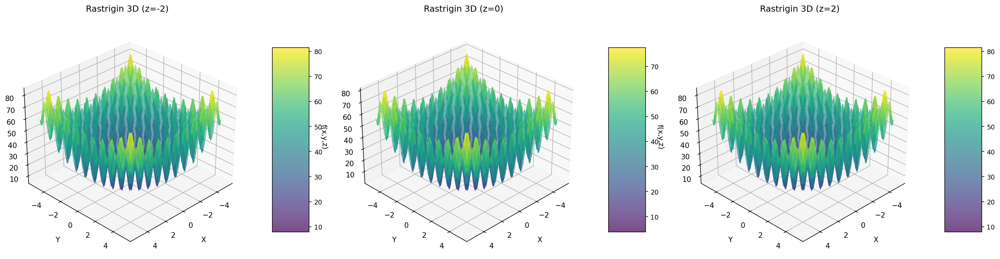

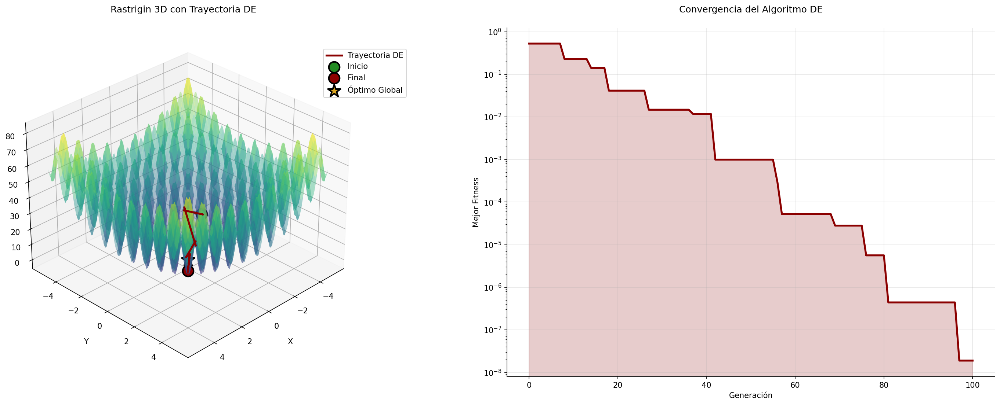


Resultados finales:
Mejor solución encontrada: [1.000009, 1.000032]
Mejor valor de fitness: 0.000000
Distancia al óptimo: 1.414243


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import make_interp_spline

def rastrigin(x):
    """Función de Rastrigin en 3D"""
    n = len(x)
    return 10 * n + sum([(xi**2 - 10 * np.cos(2 * np.pi * xi)) for xi in x])

# Configuración del estilo
plt.style.use('default')
plt.rcParams.update({
    'figure.dpi': 150,
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.grid': True,
    'grid.alpha': 0.2,
})

# Crear datos para la visualización 3D
x = np.linspace(-5.12, 5.12, 100)
y = np.linspace(-5.12, 5.12, 100)
X, Y = np.meshgrid(x, y)

# Primera figura: Cortes en diferentes niveles de Z
z_levels = [-2, 0, 2]
fig1 = plt.figure(figsize=(20, 8))

# Crear subplots para diferentes vistas
for i, z_val in enumerate(z_levels):
    ax = fig1.add_subplot(1, len(z_levels), i+1, projection='3d')

    Z = np.zeros_like(X)
    for i in range(len(x)):
        for j in range(len(y)):
            Z[i,j] = rastrigin([X[i,j], Y[i,j], z_val])

    # Graficar superficie con colores mejorados
    surf = ax.plot_surface(X, Y, Z,
                          cmap='viridis',
                          alpha=0.7,
                          linewidth=0,
                          antialiased=True,
                          rstride=2,
                          cstride=2)

    # Configurar vista y etiquetas
    ax.set_xlabel('X', labelpad=10)
    ax.set_ylabel('Y', labelpad=10)
    ax.set_zlabel('f(x,y,z)', labelpad=10)
    ax.set_title(f'Rastrigin 3D (z={z_val})', pad=20, fontsize=12)

    # Barra de color mejorada
    cbar = fig1.colorbar(surf, ax=ax, shrink=0.5, aspect=5, pad=0.1)
    cbar.ax.tick_params(labelsize=9)

    ax.view_init(elev=30, azim=45)

plt.tight_layout(pad=3.0)
plt.show()

# Segunda figura: Trayectoria y convergencia
fig2 = plt.figure(figsize=(20, 8))

# Superficie 3D con trayectoria
ax1 = fig2.add_subplot(121, projection='3d')

# Calcular superficie para z=0
Z = np.zeros_like(X)
for i in range(len(x)):
    for j in range(len(y)):
        Z[i,j] = rastrigin([X[i,j], Y[i,j], 0])

# Graficar superficie con mayor transparencia
surf = ax1.plot_surface(X, Y, Z,
                       cmap='viridis',
                       alpha=0.4,
                       linewidth=0,
                       antialiased=True)

# Suavizar trayectoria
t = np.arange(len(history))
t_smooth = np.linspace(0, len(history)-1, 400)
x_smooth = make_interp_spline(t, history[:, 0], k=3)(t_smooth)
y_smooth = make_interp_spline(t, history[:, 1], k=3)(t_smooth)
z_points = [rastrigin(point) for point in history]
z_smooth = make_interp_spline(t, z_points, k=3)(t_smooth)

# Efecto de sombra para la trayectoria
for offset in [-0.2, -0.1, 0, 0.1, 0.2]:
    ax1.plot3D(x_smooth, y_smooth, z_smooth + offset,
               color='black',
               linewidth=4,
               alpha=0.1,
               zorder=5)

# Trayectoria principal
trajectory_color = '#8B0000'  # Rojo oscuro
ax1.plot3D(x_smooth, y_smooth, z_smooth,
           color=trajectory_color,
           linewidth=2.5,
           label='Trayectoria DE',
           zorder=6)

# Puntos importantes
ax1.scatter(history[0, 0], history[0, 1], z_points[0],
            color='#228B22',  # Verde oscuro
            s=200,
            label='Inicio',
            zorder=7,
            edgecolor='black',
            linewidth=2)

ax1.scatter(history[-1, 0], history[-1, 1], z_points[-1],
            color=trajectory_color,
            s=200,
            label='Final',
            zorder=7,
            edgecolor='black',
            linewidth=2)

# Punto óptimo (0,0,0) para Rastrigin
ax1.scatter(0, 0, rastrigin([0,0,0]),
            color='#DAA520',  # Dorado
            s=300,
            label='Óptimo Global',
            marker='*',
            edgecolor='black',
            linewidth=2,
            zorder=7)

ax1.set_xlabel('X', labelpad=10)
ax1.set_ylabel('Y', labelpad=10)
ax1.set_zlabel('f(x,y,z)', labelpad=10)
ax1.set_title('Rastrigin 3D con Trayectoria DE', pad=20, fontsize=12)
ax1.legend(loc='upper right', bbox_to_anchor=(1.15, 0.95))
ax1.view_init(elev=30, azim=45)

# Gráfica de convergencia
ax2 = fig2.add_subplot(122)
ax2.plot(score_history, color=trajectory_color, linewidth=2.5)
ax2.fill_between(range(len(score_history)), score_history,
                 alpha=0.2, color=trajectory_color)

ax2.set_yscale('log')
ax2.set_xlabel('Generación', fontsize=10)
ax2.set_ylabel('Mejor Fitness', fontsize=10)
ax2.set_title('Convergencia del Algoritmo DE', pad=20, fontsize=12)
ax2.grid(True, alpha=0.3)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout(pad=3.0)
plt.show()

# Imprimir resultados con formato mejorado
print("\nResultados finales:")
print("=" * 50)
print(f"Mejor solución encontrada: [{', '.join([f'{x:.6f}' for x in history[-1]])}]")
print(f"Mejor valor de fitness: {score_history[-1]:.6f}")
print(f"Distancia al óptimo: {np.linalg.norm(history[-1]):.6f}")
print("=" * 50)